In [1]:
import meep as mp
import meep.adjoint as mpa
from meep import Animate2D
import numpy as np
from autograd import numpy as npa
from autograd import tensor_jacobian_product, grad
import nlopt
from matplotlib import pyplot as plt
from matplotlib.patches import Circle
from meep.materials import Ag
import os
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from PIL import Image
#from meep.materials import c-Si


os.makedirs(f'PICTURE',exist_ok=True)
mp.verbosity(0)
TiO2 = mp.Medium(index=2.6)
SiO2 = mp.Medium(index=1.44)
Si = mp.Medium(index=3.4)
Air = mp.Medium(index=1)

In [2]:
resolution = 100
design_region_resolution = int(resolution)

design_region_x_width  = 1   #100 nm
design_region_y_height = 1   #100 nm
design_region_z_height = 0.03  #20 nm or 10nm

pml_size = 1.0
pml_layers = [mp.PML(pml_size,direction=mp.Z)]

Sz_size = 0.6
Sx = design_region_x_width
Sy = design_region_y_height 
Sz = 2 * pml_size + design_region_z_height + Sz_size
cell_size = mp.Vector3(Sx, Sy, Sz)

wavelengths = np.array([1.55])     # wavelengths = np.array([1.5 ,1.55, 1.6])
frequencies = np.array([1 / 1.55])

nf = 1                 #3 #wavelengths Number

minimum_length = 0.01  # minimum length scale (microns)
eta_i = 0.5            # blueprint (or intermediate) design field thresholding point (between 0 and 1)
eta_e = 0.55           # erosion design field thresholding point (between 0 and 1)
eta_d = 1 - eta_e      # dilation design field thresholding point (between 0 and 1)
filter_radius = mpa.get_conic_radius_from_eta_e(minimum_length, eta_e)

Source_distance = -0.2

fcen   = 1 / 1.55
width  = 0.2  
fwidth = width * fcen
source_center = mp.Vector3(0,0,Source_distance)  
source_size   = mp.Vector3(design_region_x_width, design_region_y_height, 0)
src    = mp.GaussianSource(frequency=fcen, fwidth=fwidth, is_integrated=True)
source = [mp.Source(src, component=mp.Ey, size=source_size, center=source_center)]   

Nx = int(design_region_resolution * design_region_x_width) + 1
Ny = int(design_region_resolution * design_region_y_height) + 1
Nz = 1

design_variables = mp.MaterialGrid(mp.Vector3(Nx, Ny, Nz), Air, Si, grid_type="U_MEAN")
design_region    = mpa.DesignRegion(
            design_variables,
            volume=mp.Volume(
            center=mp.Vector3(0,0,0),
            size=mp.Vector3(design_region_x_width, design_region_y_height, design_region_z_height),
            ),
)

def mapping(x, eta, beta):
    # filter
    filtered_field = mpa.conic_filter(
        x,
        filter_radius,
        design_region_x_width,
        design_region_y_height,
        design_region_resolution,
    )
    # projection
    projected_field = mpa.tanh_projection(filtered_field, beta, eta)
    projected_field = (npa.fliplr(projected_field) + projected_field) / 2
    projected_field = (npa.flipud(projected_field) + projected_field) / 2  # left-right symmetry    
    
    return projected_field.flatten()


geometry = [mp.Block(center=design_region.center, size=design_region.size, material=design_variables)]

kpoint = mp.Vector3()  # Periodic Boundary
sim = mp.Simulation(
    cell_size        = cell_size,
    boundary_layers  = pml_layers,
    geometry         = geometry,
    sources          = source,
    default_material = Air,
    k_point          = kpoint,
    symmetries       = [mp.Mirror(direction=mp.X)], 
    resolution       = resolution,
    extra_materials  = [Ag],       # Introducing metal complex terms
)
#---------------------------------------------------------------------------------------------------#


#-----------------[4]---------------------------------#
monitor_position   = mp.Vector3(0, 0, 0)       # Focus position
monitor_size       = mp.Vector3(0.01,0.01,0.01)     # Focus Size//////0.11
FourierFields_x    = mpa.FourierFields(sim,mp.Volume(center=monitor_position,size=monitor_size),mp.Ex,yee_grid=False)
FourierFields_y    = mpa.FourierFields(sim,mp.Volume(center=monitor_position,size=monitor_size),mp.Ey,yee_grid=False)
FourierFields_z    = mpa.FourierFields(sim,mp.Volume(center=monitor_position,size=monitor_size),mp.Ez,yee_grid=False)
ob_list            = [FourierFields_x,FourierFields_y,FourierFields_z]


def J(fields_x,fields_y,fields_z):
    ET_x = npa.abs(fields_x) ** 2
    ET_y = npa.abs(fields_y) ** 2
    ET_z = npa.abs(fields_z) ** 2
    ET = npa.sqrt( npa.mean(ET_x) + npa.mean(ET_y) + npa.mean(ET_z) )  
    return ET


opt = mpa.OptimizationProblem(
    simulation=sim,
    objective_functions=[J],
    objective_arguments=ob_list,
    design_regions=[design_region],
    frequencies=frequencies,
    decimation_factor = 1 ,           # KEY BUG!!
    maximum_run_time=50,
)

[0.50008082 0.50005634 0.50004637 ... 0.50004637 0.50005634 0.50008082]
2
0.5
4
[0.5 0.5 0.5 ... 0.5 0.5 0.5]


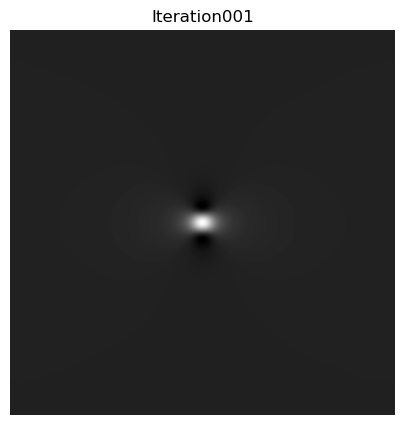

[0.50094896 0.50066214 0.50054516 ... 0.50054516 0.50066214 0.50094896]
2
0.5
4
[0.5 0.5 0.5 ... 0.5 0.5 0.5]


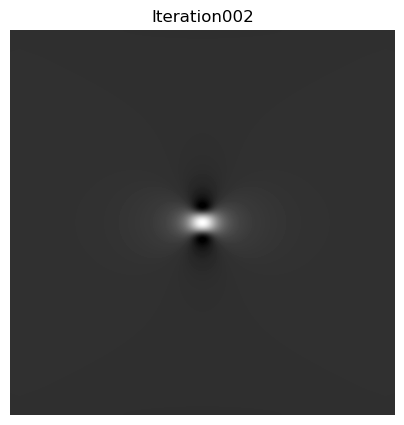

[0.52224299 0.51583295 0.51315404 ... 0.51315404 0.51583295 0.52224299]
2
0.5
4
[0.5 0.5 0.5 ... 0.5 0.5 0.5]


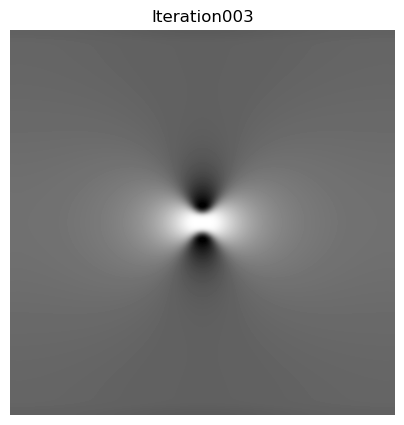

[1. 1. 1. ... 1. 1. 1.]
2
0.5
4
[0.5 0.5 0.5 ... 0.5 0.5 0.5]


/home/ming/anaconda3/envs/mp/lib/python3.8/site-packages/meep/geom.py:588: UserWarning: The weights parameter of MaterialGrid must be in the range [0,1].
  warnings.warn(


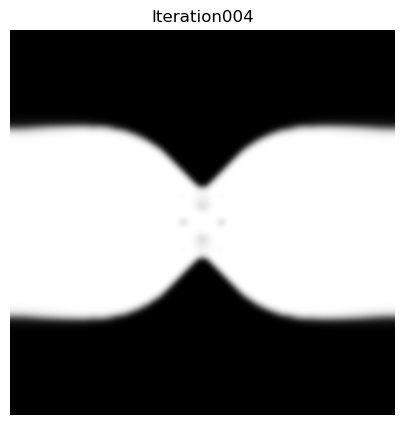

[0.94761563 0.90252892 0.88006824 ... 0.88006824 0.90252892 0.94761563]
2
0.5
4
[0.5 0.5 0.5 ... 0.5 0.5 0.5]


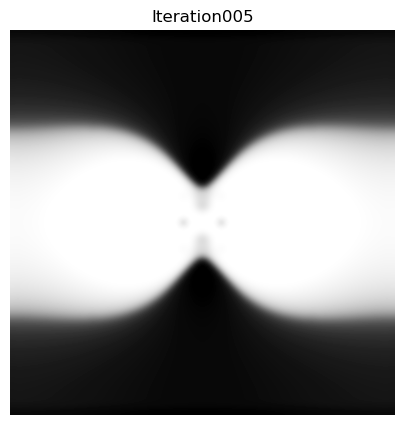

[0.67816367 0.63958297 0.62279536 ... 0.62279536 0.63958297 0.67816367]
2
0.5
4
[0.5 0.5 0.5 ... 0.5 0.5 0.5]


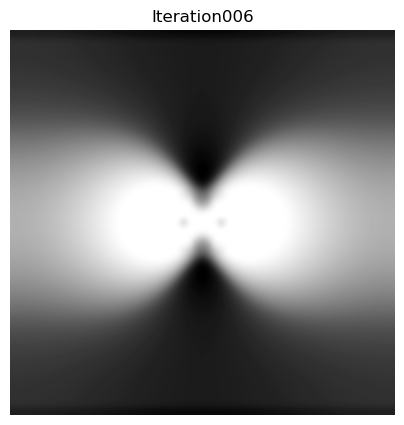

[0.54599761 0.53302629 0.52779678 ... 0.52779678 0.53302629 0.54599761]
2
0.5
4
[0.5 0.5 0.5 ... 0.5 0.5 0.5]


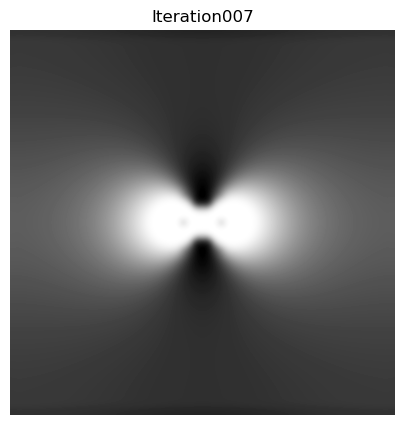

[0.52476554 0.51762845 0.51467331 ... 0.51467331 0.51762845 0.52476554]
2
0.5
4
[0.5 0.5 0.5 ... 0.5 0.5 0.5]


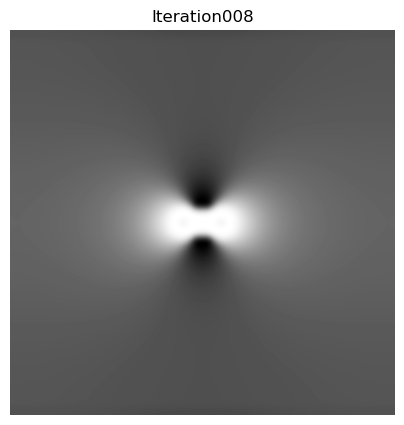

[0.52254759 0.51604937 0.51333704 ... 0.51333704 0.51604937 0.52254759]
2
0.5
4
[0.5 0.5 0.5 ... 0.5 0.5 0.5]


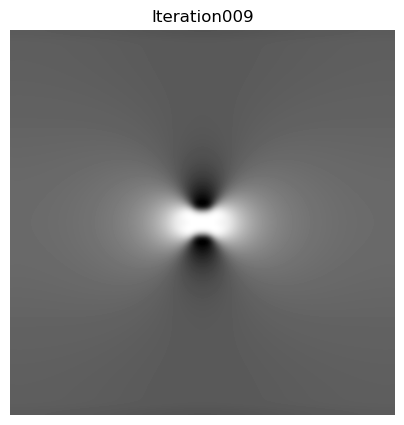

[0.52230302 0.5158756  0.5131901  ... 0.5131901  0.5158756  0.52230302]
2
0.5
4
[0.5 0.5 0.5 ... 0.5 0.5 0.5]


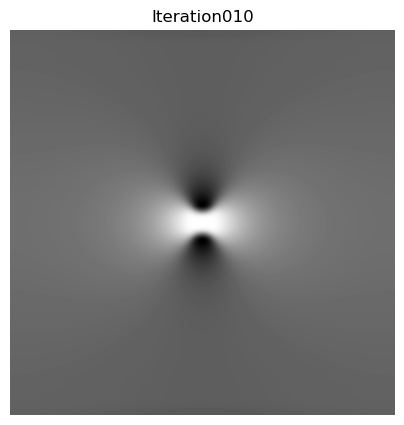

[0.52225786 0.51584351 0.51316297 ... 0.51316297 0.51584351 0.52225786]
2
0.5
4
[0.5 0.5 0.5 ... 0.5 0.5 0.5]


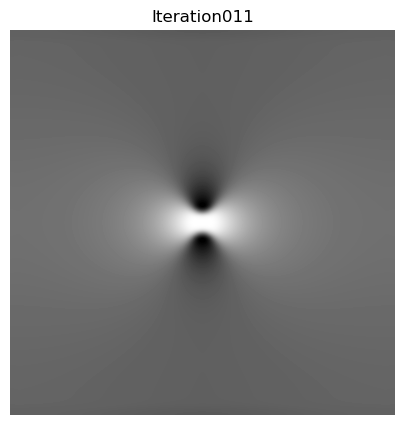

[0.52224823 0.51583668 0.51315719 ... 0.51315719 0.51583668 0.52224823]
2
0.5
4
[0.5 0.5 0.5 ... 0.5 0.5 0.5]


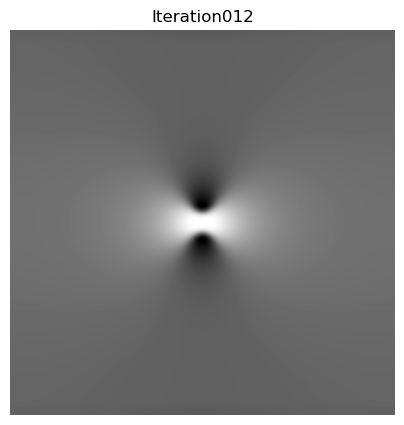

[0.52234859 0.51590795 0.5132174  ... 0.5132174  0.51590795 0.52234859]
2
0.5
4
[0.5 0.5 0.5 ... 0.5 0.5 0.5]


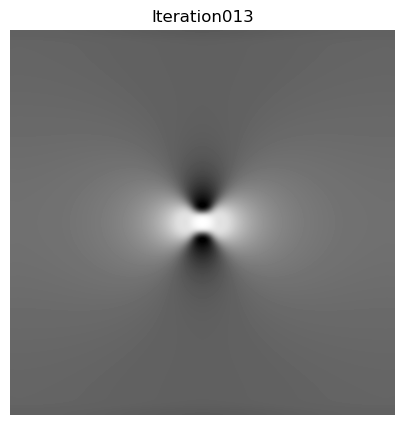

[0.52227532 0.51585591 0.51317344 ... 0.51317344 0.51585591 0.52227532]
2
0.5
4
[0.5 0.5 0.5 ... 0.5 0.5 0.5]


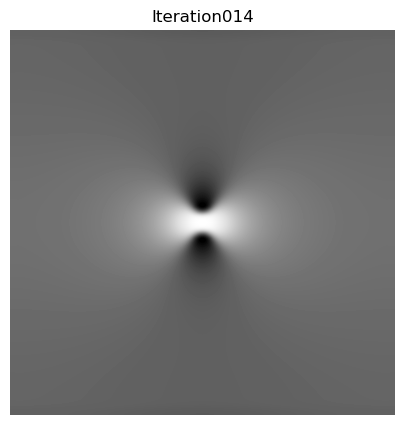

[0.52224823 0.51583668 0.51315719 ... 0.51315719 0.51583668 0.52224823]
2
0.5
8
[0.52224823 0.51583668 0.51315719 ... 0.51315719 0.51583668 0.52224823]


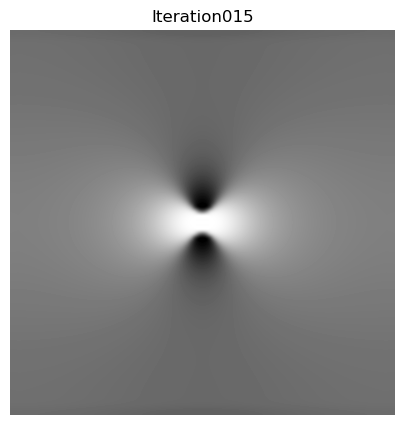

[0.52735201 0.51953893 0.51635342 ... 0.51635342 0.51953893 0.52735201]
2
0.5
8
[0.52224823 0.51583668 0.51315719 ... 0.51315719 0.51583668 0.52224823]


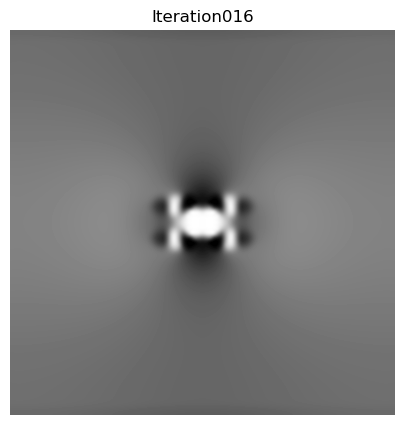

[0.52277098 0.51621396 0.51348231 ... 0.51348231 0.51621396 0.52277098]
2
0.5
8
[0.52224823 0.51583668 0.51315719 ... 0.51315719 0.51583668 0.52224823]


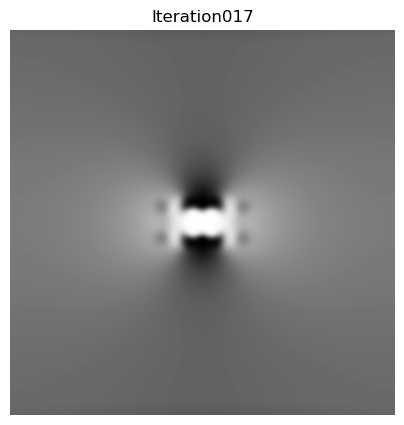

[0.52290098 0.51630805 0.51356394 ... 0.51356394 0.51630805 0.52290098]
2
0.5
8
[0.52224823 0.51583668 0.51315719 ... 0.51315719 0.51583668 0.52224823]


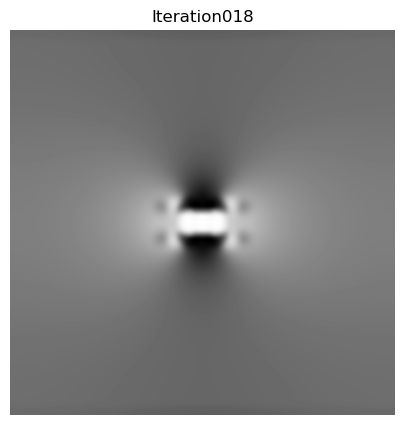

[0.52280317 0.51623725 0.51350252 ... 0.51350252 0.51623725 0.52280317]
2
0.5
8
[0.52224823 0.51583668 0.51315719 ... 0.51315719 0.51583668 0.52224823]


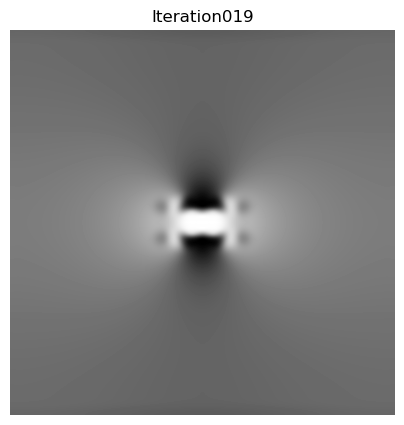

[0.52278186 0.51622183 0.51348914 ... 0.51348914 0.51622183 0.52278186]
2
0.5
8
[0.52224823 0.51583668 0.51315719 ... 0.51315719 0.51583668 0.52224823]


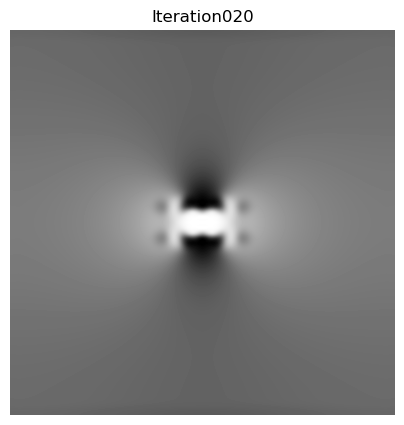

[0.52277503 0.51621689 0.51348485 ... 0.51348485 0.51621689 0.52277503]
2
0.5
8
[0.52224823 0.51583668 0.51315719 ... 0.51315719 0.51583668 0.52224823]


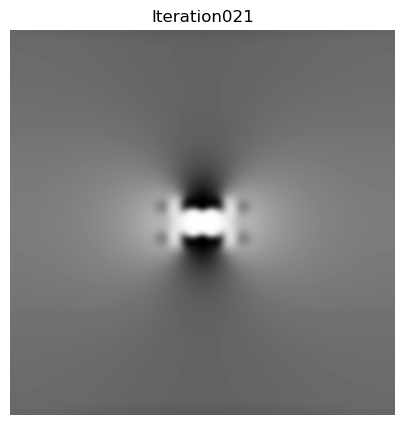

[0.52277263 0.51621515 0.51348334 ... 0.51348334 0.51621515 0.52277263]
2
0.5
8
[0.52224823 0.51583668 0.51315719 ... 0.51315719 0.51583668 0.52224823]


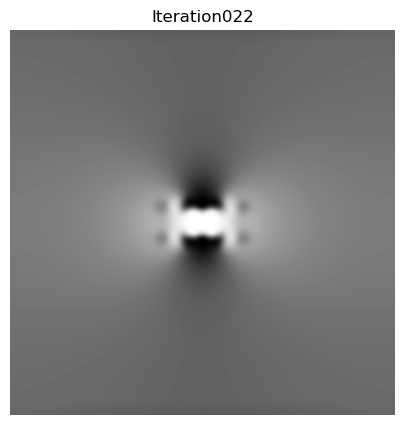

[0.52277165 0.51621444 0.51348273 ... 0.51348273 0.51621444 0.52277165]
2
0.5
8
[0.52224823 0.51583668 0.51315719 ... 0.51315719 0.51583668 0.52224823]


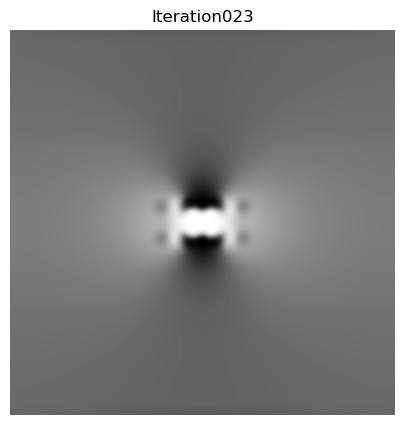

[0.52277126 0.51621416 0.51348248 ... 0.51348248 0.51621416 0.52277126]
2
0.5
8
[0.52224823 0.51583668 0.51315719 ... 0.51315719 0.51583668 0.52224823]


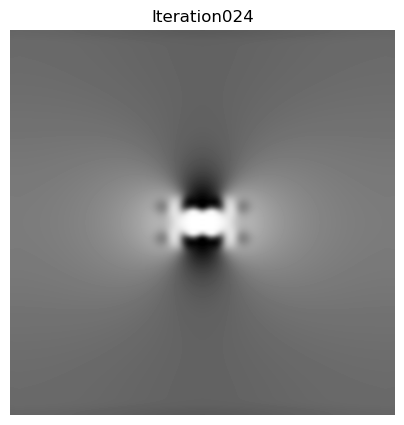

[0.5227711  0.51621404 0.51348238 ... 0.51348238 0.51621404 0.5227711 ]
2
0.5
8
[0.52224823 0.51583668 0.51315719 ... 0.51315719 0.51583668 0.52224823]


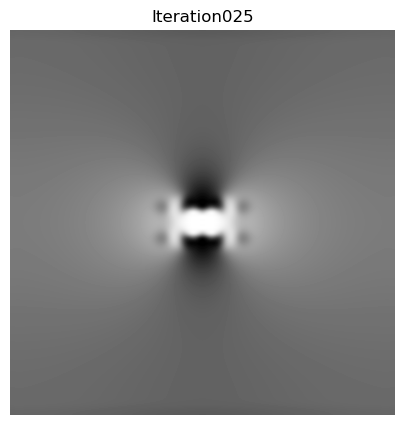

[0.52277103 0.51621399 0.51348234 ... 0.51348234 0.51621399 0.52277103]
2
0.5
8
[0.52224823 0.51583668 0.51315719 ... 0.51315719 0.51583668 0.52224823]


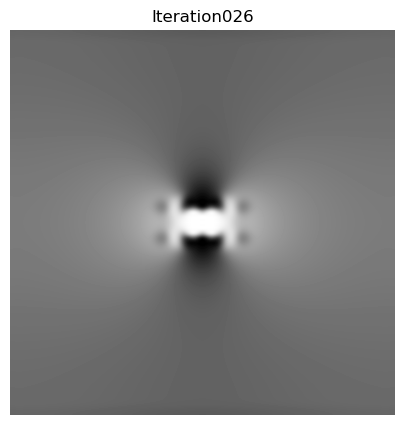

[0.522771   0.51621397 0.51348232 ... 0.51348232 0.51621397 0.522771  ]
2
0.5
8
[0.52224823 0.51583668 0.51315719 ... 0.51315719 0.51583668 0.52224823]


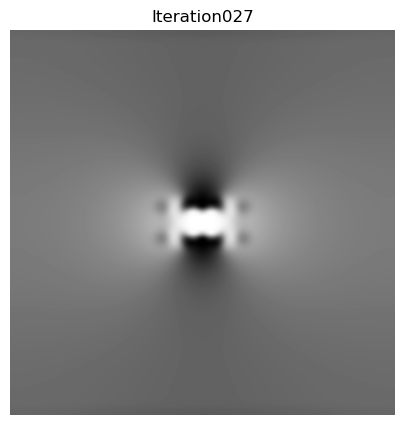

[0.52277099 0.51621396 0.51348231 ... 0.51348231 0.51621396 0.52277099]
2
0.5
8
[0.52224823 0.51583668 0.51315719 ... 0.51315719 0.51583668 0.52224823]


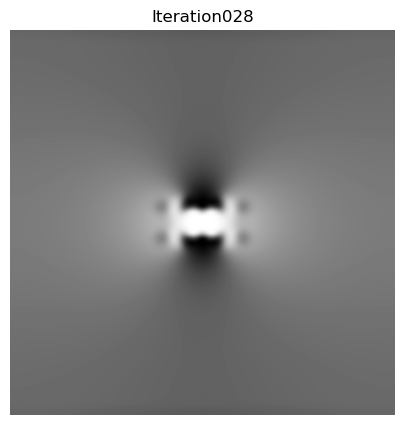

[0.52277099 0.51621396 0.51348231 ... 0.51348231 0.51621396 0.52277099]
2
0.5
8
[0.52224823 0.51583668 0.51315719 ... 0.51315719 0.51583668 0.52224823]


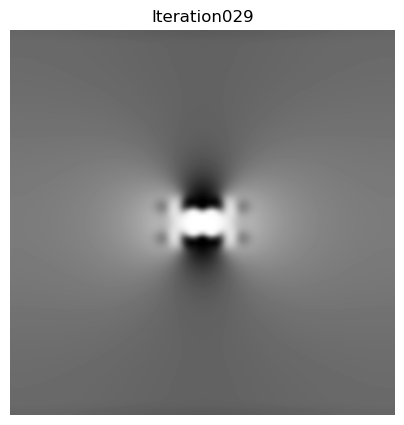

[0.52277098 0.51621396 0.51348231 ... 0.51348231 0.51621396 0.52277098]
2
0.5
16
[0.52277098 0.51621396 0.51348231 ... 0.51348231 0.51621396 0.52277098]


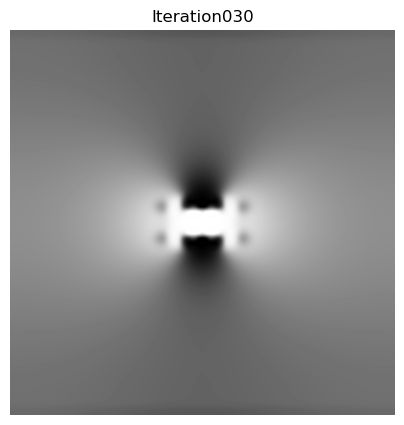

[0.5253108  0.51812236 0.51521329 ... 0.51521329 0.51812236 0.5253108 ]
2
0.5
16
[0.52277098 0.51621396 0.51348231 ... 0.51348231 0.51621396 0.52277098]


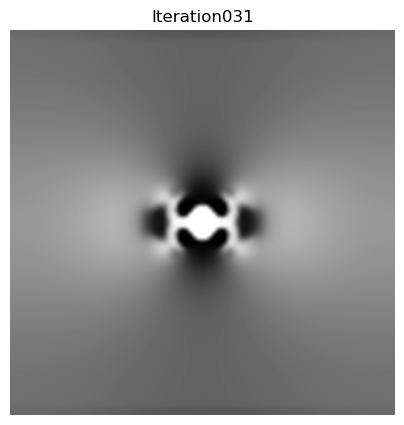

[0.5230273  0.51640611 0.51365649 ... 0.51365649 0.51640611 0.5230273 ]
2
0.5
16
[0.52277098 0.51621396 0.51348231 ... 0.51348231 0.51621396 0.52277098]


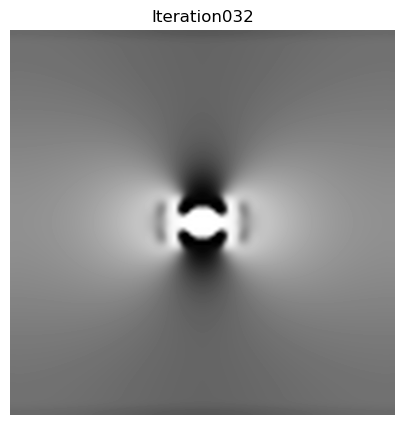

[0.52281597 0.51624768 0.51351287 ... 0.51351287 0.51624768 0.52281597]
2
0.5
16
[0.52277098 0.51621396 0.51348231 ... 0.51348231 0.51621396 0.52277098]


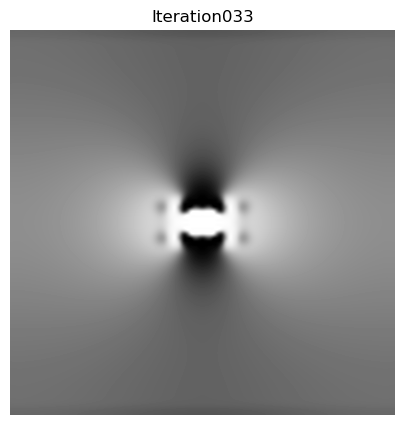

[0.52284175 0.51626698 0.51353032 ... 0.51353032 0.51626698 0.52284175]
2
0.5
16
[0.52277098 0.51621396 0.51348231 ... 0.51348231 0.51621396 0.52277098]


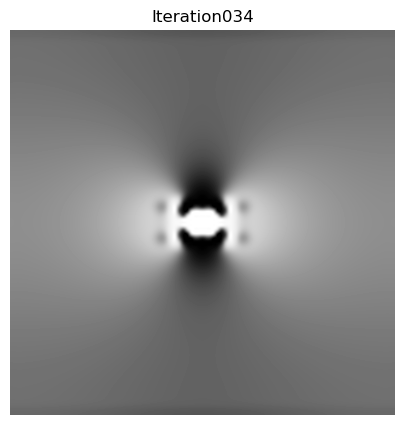

[0.52282339 0.51625323 0.51351789 ... 0.51351789 0.51625323 0.52282339]
2
0.5
16
[0.52277098 0.51621396 0.51348231 ... 0.51348231 0.51621396 0.52277098]


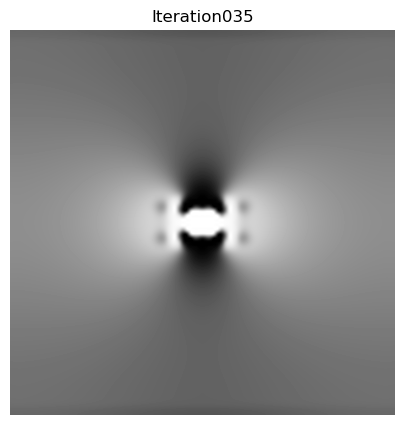

[0.52281869 0.51624971 0.51351471 ... 0.51351471 0.51624971 0.52281869]
2
0.5
16
[0.52277098 0.51621396 0.51348231 ... 0.51348231 0.51621396 0.52277098]


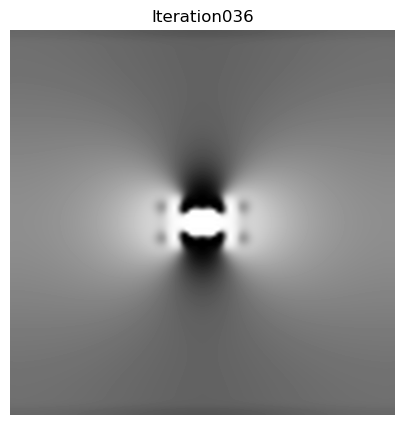

[0.52281705 0.51624849 0.5135136  ... 0.5135136  0.51624849 0.52281705]
2
0.5
16
[0.52277098 0.51621396 0.51348231 ... 0.51348231 0.51621396 0.52277098]


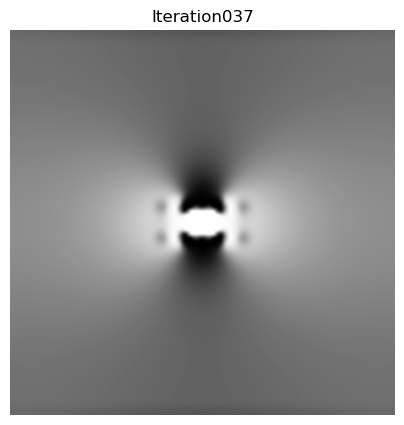

[0.52281642 0.51624802 0.51351318 ... 0.51351318 0.51624802 0.52281642]
2
0.5
16
[0.52277098 0.51621396 0.51348231 ... 0.51348231 0.51621396 0.52277098]


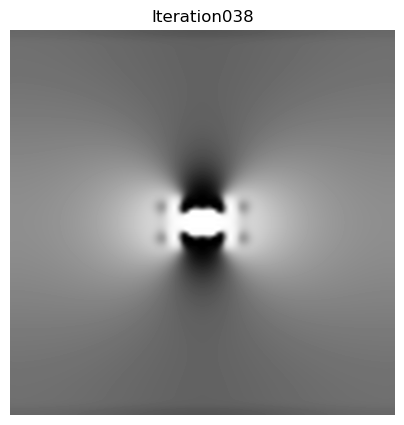

[0.52281616 0.51624782 0.513513   ... 0.513513   0.51624782 0.52281616]
2
0.5
16
[0.52277098 0.51621396 0.51348231 ... 0.51348231 0.51621396 0.52277098]


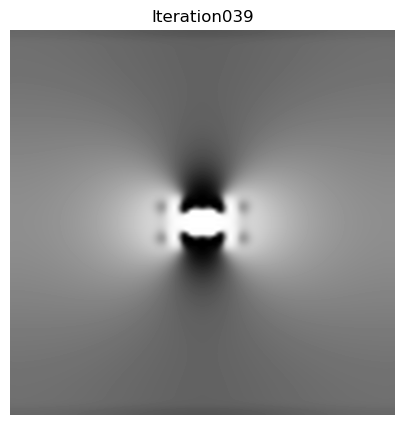

[0.52281606 0.51624774 0.51351293 ... 0.51351293 0.51624774 0.52281606]
2
0.5
16
[0.52277098 0.51621396 0.51348231 ... 0.51348231 0.51621396 0.52277098]


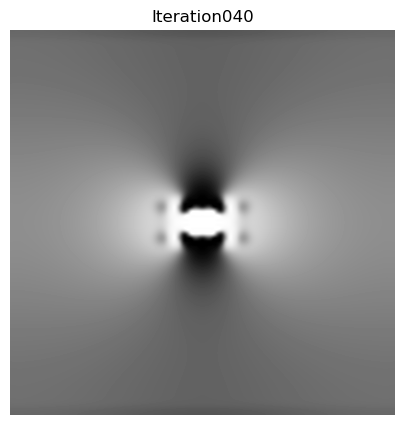

[0.52281601 0.51624771 0.5135129  ... 0.5135129  0.51624771 0.52281601]
2
0.5
16
[0.52277098 0.51621396 0.51348231 ... 0.51348231 0.51621396 0.52277098]


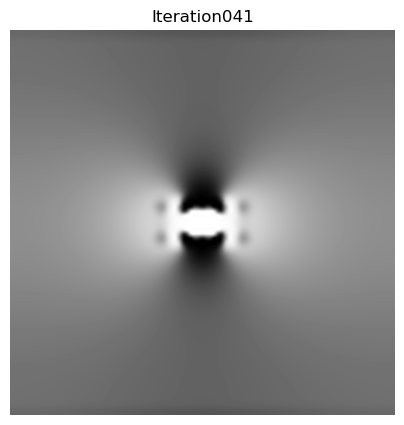

[0.52281603 0.51624772 0.51351291 ... 0.51351291 0.51624772 0.52281603]
2
0.5
16
[0.52277098 0.51621396 0.51348231 ... 0.51348231 0.51621396 0.52277098]


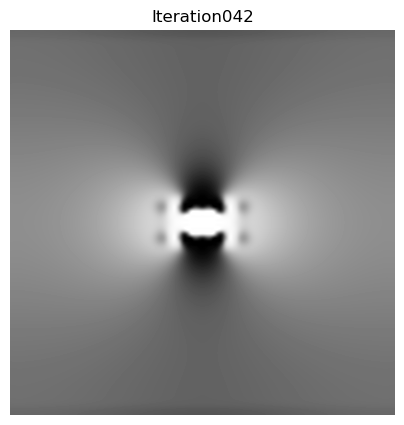

[0.52281602 0.51624771 0.5135129  ... 0.5135129  0.51624771 0.52281602]
2
0.5
16
[0.52277098 0.51621396 0.51348231 ... 0.51348231 0.51621396 0.52277098]


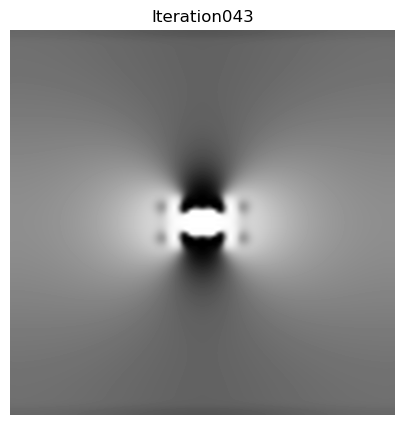

[0.52281601 0.51624771 0.5135129  ... 0.5135129  0.51624771 0.52281601]
2
0.5
16
[0.52277098 0.51621396 0.51348231 ... 0.51348231 0.51621396 0.52277098]


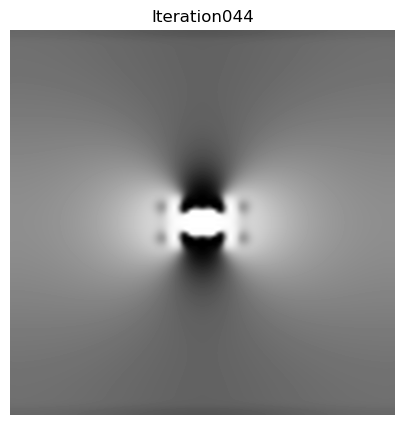

[0.52281601 0.51624771 0.5135129  ... 0.5135129  0.51624771 0.52281601]
2
0.5
32
[0.52281601 0.51624771 0.5135129  ... 0.5135129  0.51624771 0.52281601]


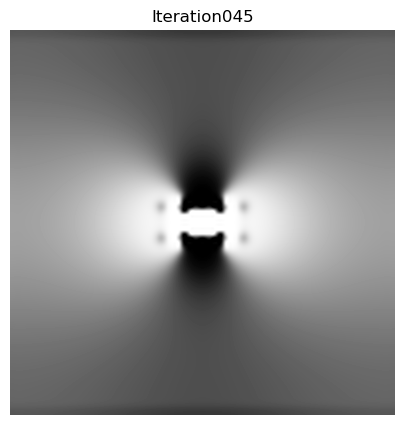

[0.52568283 0.51857471 0.51583116 ... 0.51583116 0.51857471 0.52568283]
2
0.5
32
[0.52281601 0.51624771 0.5135129  ... 0.5135129  0.51624771 0.52281601]


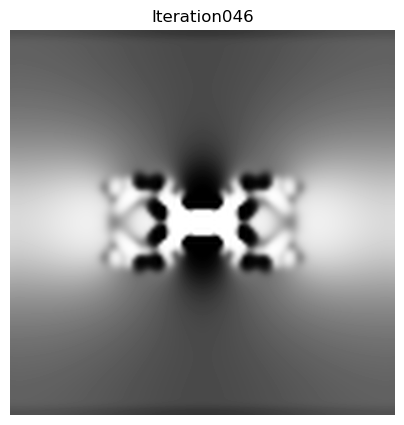

[0.52650347 0.51924562 0.51650409 ... 0.51650409 0.51924562 0.52650347]
2
0.5
32
[0.52281601 0.51624771 0.5135129  ... 0.5135129  0.51624771 0.52281601]


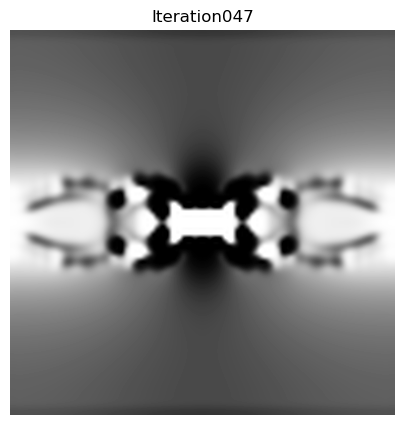

[0.52579542 0.51866671 0.51592344 ... 0.51592344 0.51866671 0.52579542]
2
0.5
32
[0.52281601 0.51624771 0.5135129  ... 0.5135129  0.51624771 0.52281601]


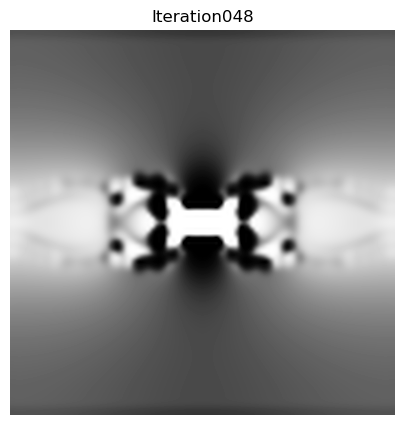

[0.52570991 0.51859684 0.51585336 ... 0.51585336 0.51859684 0.52570991]
2
0.5
32
[0.52281601 0.51624771 0.5135129  ... 0.5135129  0.51624771 0.52281601]


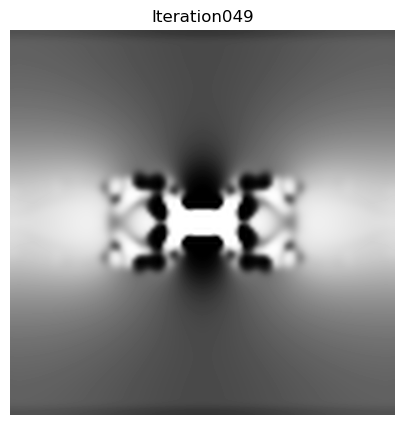

[0.52569167 0.51858193 0.51583841 ... 0.51583841 0.51858193 0.52569167]
2
0.5
32
[0.52281601 0.51624771 0.5135129  ... 0.5135129  0.51624771 0.52281601]


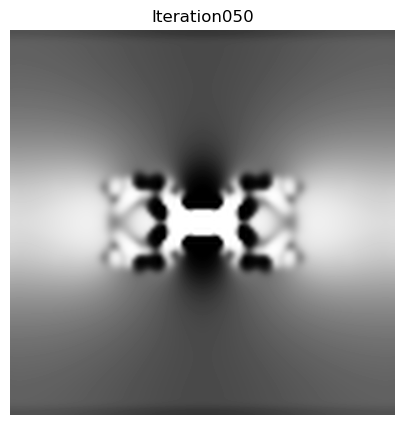

[0.52568619 0.51857745 0.51583392 ... 0.51583392 0.51857745 0.52568619]
2
0.5
32
[0.52281601 0.51624771 0.5135129  ... 0.5135129  0.51624771 0.52281601]


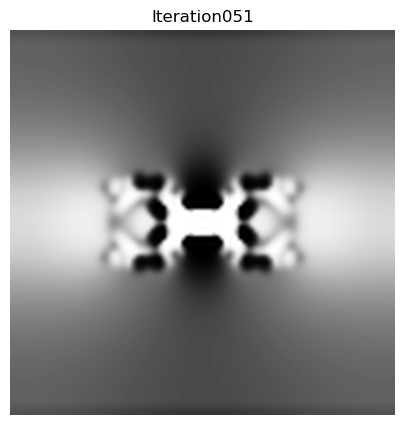

[0.52568758 0.51857859 0.51583506 ... 0.51583506 0.51857859 0.52568758]
2
0.5
32
[0.52281601 0.51624771 0.5135129  ... 0.5135129  0.51624771 0.52281601]


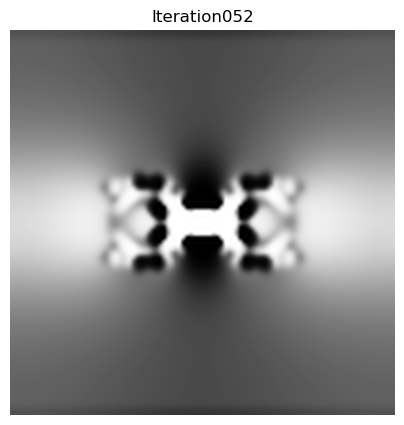

[0.52568827 0.51857915 0.51583562 ... 0.51583562 0.51857915 0.52568827]
2
0.5
32
[0.52281601 0.51624771 0.5135129  ... 0.5135129  0.51624771 0.52281601]


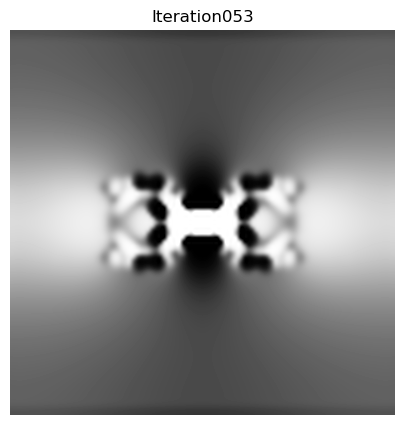

[0.52568787 0.51857883 0.5158353  ... 0.5158353  0.51857883 0.52568787]
2
0.5
32
[0.52281601 0.51624771 0.5135129  ... 0.5135129  0.51624771 0.52281601]


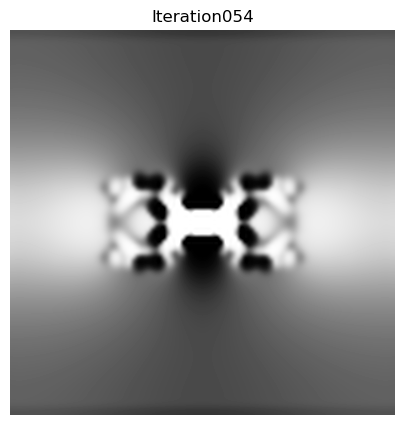

[0.5256877  0.51857869 0.51583516 ... 0.51583516 0.51857869 0.5256877 ]
2
0.5
32
[0.52281601 0.51624771 0.5135129  ... 0.5135129  0.51624771 0.52281601]


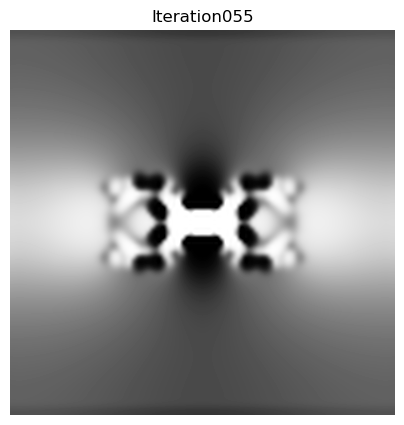

[0.52568763 0.51857863 0.5158351  ... 0.5158351  0.51857863 0.52568763]
2
0.5
32
[0.52281601 0.51624771 0.5135129  ... 0.5135129  0.51624771 0.52281601]


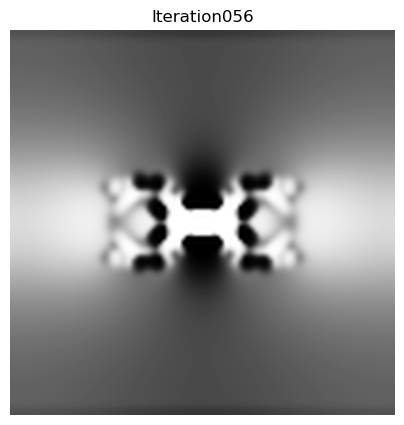

[0.5256876  0.51857861 0.51583507 ... 0.51583507 0.51857861 0.5256876 ]
2
0.5
32
[0.52281601 0.51624771 0.5135129  ... 0.5135129  0.51624771 0.52281601]


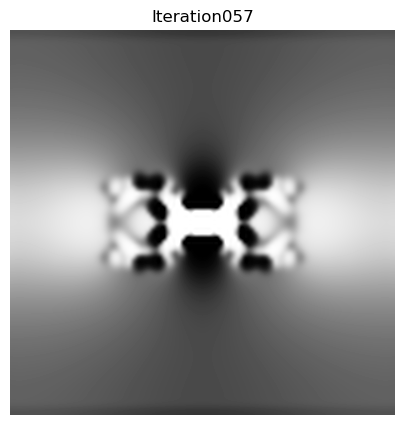

[0.52568759 0.5185786  0.51583506 ... 0.51583506 0.5185786  0.52568759]
2
0.5
32
[0.52281601 0.51624771 0.5135129  ... 0.5135129  0.51624771 0.52281601]


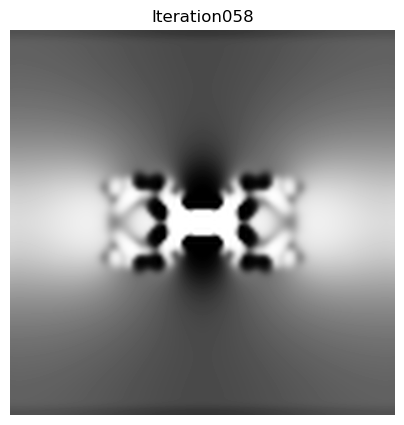

[0.52568758 0.51857859 0.51583506 ... 0.51583506 0.51857859 0.52568758]
2
0.5
32
[0.52281601 0.51624771 0.5135129  ... 0.5135129  0.51624771 0.52281601]


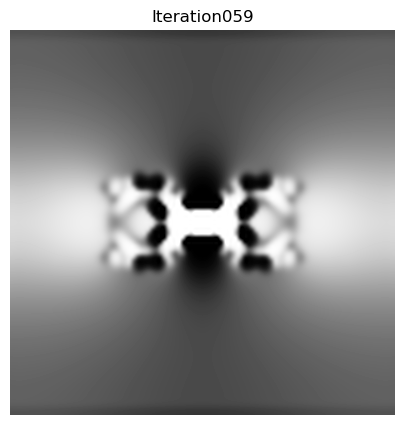

[0.52568758 0.51857859 0.51583506 ... 0.51583506 0.51857859 0.52568758]
2
0.5
64
[0.52568758 0.51857859 0.51583506 ... 0.51583506 0.51857859 0.52568758]


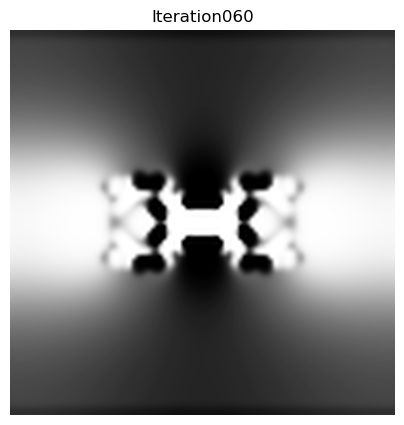

[0.52686441 0.51972862 0.51721964 ... 0.51721964 0.51972862 0.52686441]
2
0.5
64
[0.52568758 0.51857859 0.51583506 ... 0.51583506 0.51857859 0.52568758]


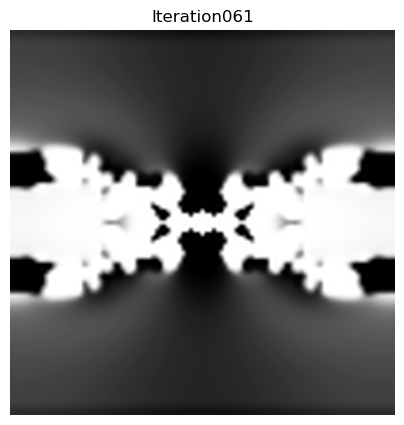

[0.52691968 0.51978096 0.51727926 ... 0.51727926 0.51978096 0.52691968]
2
0.5
64
[0.52568758 0.51857859 0.51583506 ... 0.51583506 0.51857859 0.52568758]


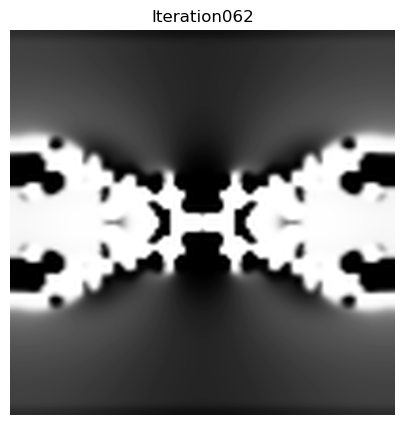

[0.52699813 0.51985702 0.51736968 ... 0.51736968 0.51985702 0.52699813]
2
0.5
64
[0.52568758 0.51857859 0.51583506 ... 0.51583506 0.51857859 0.52568758]


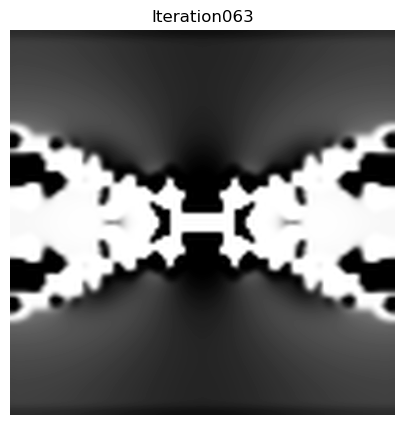

[0.52693288 0.51979376 0.51729447 ... 0.51729447 0.51979376 0.52693288]
2
0.5
64
[0.52568758 0.51857859 0.51583506 ... 0.51583506 0.51857859 0.52568758]


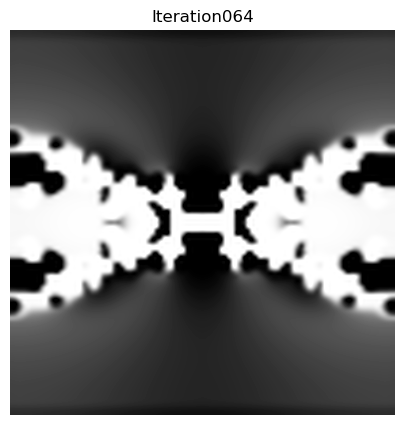

[0.52692316 0.51978434 0.51728326 ... 0.51728326 0.51978434 0.52692316]
2
0.5
64
[0.52568758 0.51857859 0.51583506 ... 0.51583506 0.51857859 0.52568758]


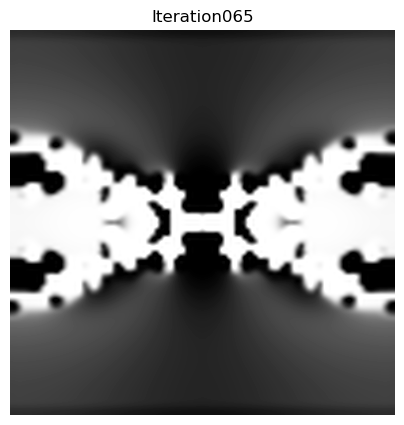

[0.52692086 0.51978211 0.51728061 ... 0.51728061 0.51978211 0.52692086]
2
0.5
64
[0.52568758 0.51857859 0.51583506 ... 0.51583506 0.51857859 0.52568758]


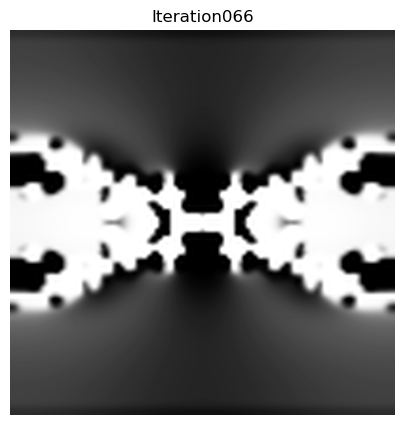

[0.52692211 0.51978332 0.51728206 ... 0.51728206 0.51978332 0.52692211]
2
0.5
64
[0.52568758 0.51857859 0.51583506 ... 0.51583506 0.51857859 0.52568758]


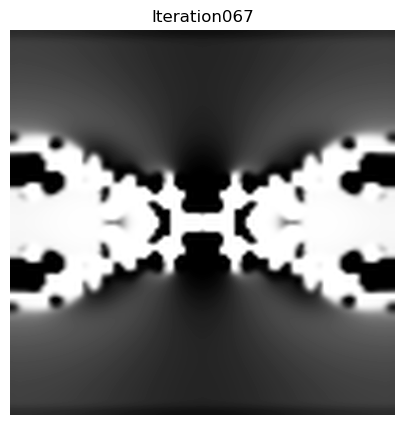

[0.52692259 0.51978378 0.51728261 ... 0.51728261 0.51978378 0.52692259]
2
0.5
64
[0.52568758 0.51857859 0.51583506 ... 0.51583506 0.51857859 0.52568758]


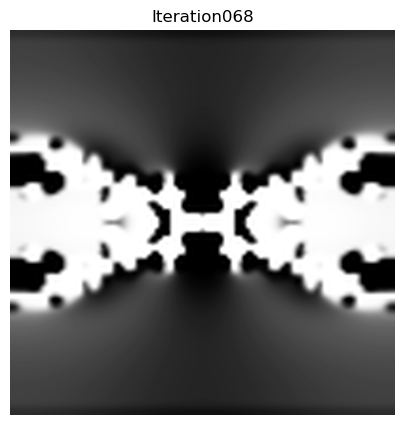

[0.5269223  0.51978351 0.51728229 ... 0.51728229 0.51978351 0.5269223 ]
2
0.5
64
[0.52568758 0.51857859 0.51583506 ... 0.51583506 0.51857859 0.52568758]


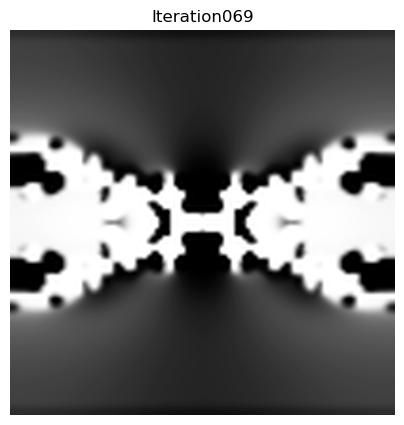

[0.52692219 0.5197834  0.51728215 ... 0.51728215 0.5197834  0.52692219]
2
0.5
64
[0.52568758 0.51857859 0.51583506 ... 0.51583506 0.51857859 0.52568758]


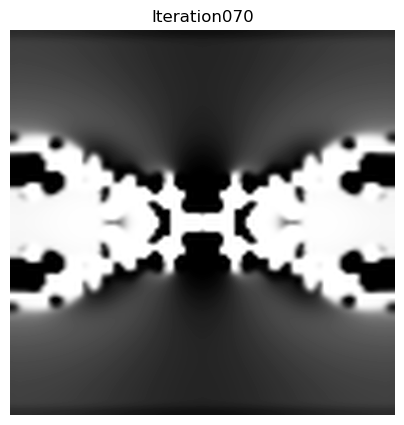

[0.52692225 0.51978346 0.51728223 ... 0.51728223 0.51978346 0.52692225]
2
0.5
64
[0.52568758 0.51857859 0.51583506 ... 0.51583506 0.51857859 0.52568758]


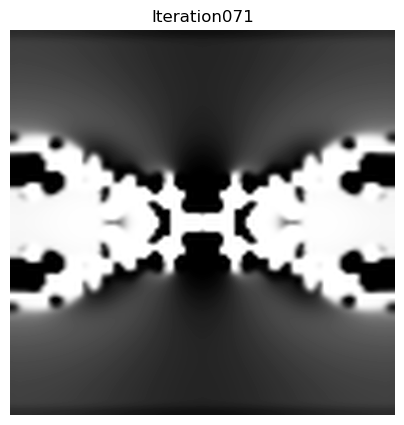

[0.52692304 0.51978422 0.51728313 ... 0.51728313 0.51978422 0.52692304]
2
0.5
64
[0.52568758 0.51857859 0.51583506 ... 0.51583506 0.51857859 0.52568758]


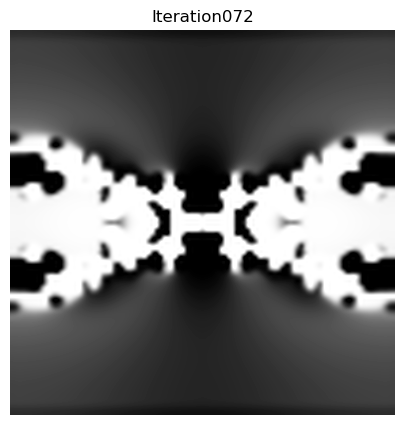

[0.52692257 0.51978377 0.51728259 ... 0.51728259 0.51978377 0.52692257]
2
0.5
64
[0.52568758 0.51857859 0.51583506 ... 0.51583506 0.51857859 0.52568758]


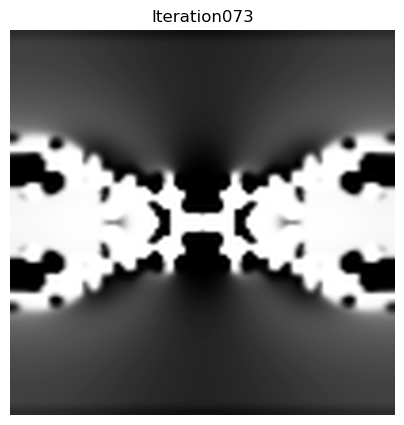

[0.52692239 0.51978359 0.51728238 ... 0.51728238 0.51978359 0.52692239]
2
0.5
64
[0.52568758 0.51857859 0.51583506 ... 0.51583506 0.51857859 0.52568758]


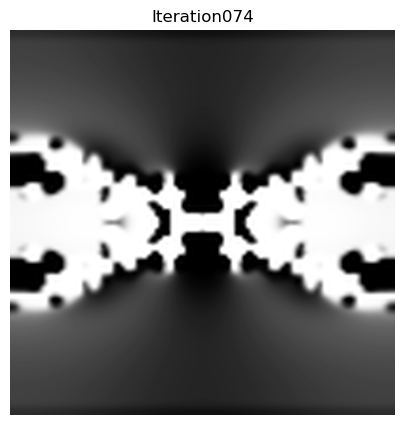

[0.52692225 0.51978346 0.51728223 ... 0.51728223 0.51978346 0.52692225]
2
0.5
128
[0.52692225 0.51978346 0.51728223 ... 0.51728223 0.51978346 0.52692225]


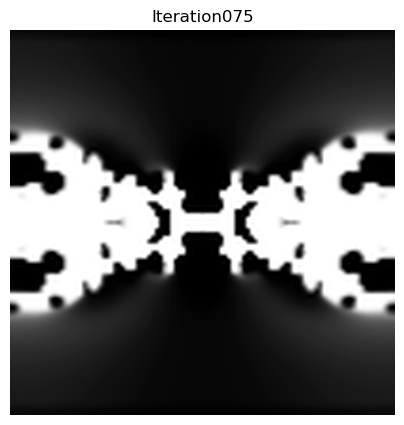

[0.52727982 0.52029238 0.51809147 ... 0.51809147 0.52029238 0.52727982]
2
0.5
128
[0.52692225 0.51978346 0.51728223 ... 0.51728223 0.51978346 0.52692225]


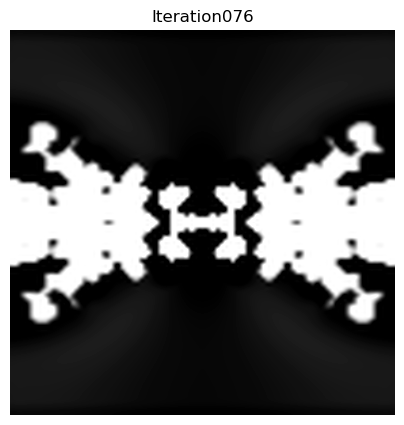

[0.52729125 0.52030771 0.51811427 ... 0.51811427 0.52030771 0.52729125]
2
0.5
128
[0.52692225 0.51978346 0.51728223 ... 0.51728223 0.51978346 0.52692225]


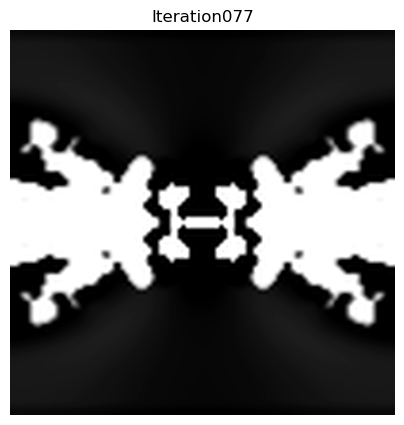

[0.52728099 0.52029395 0.51809381 ... 0.51809381 0.52029395 0.52728099]
2
0.5
128
[0.52692225 0.51978346 0.51728223 ... 0.51728223 0.51978346 0.52692225]


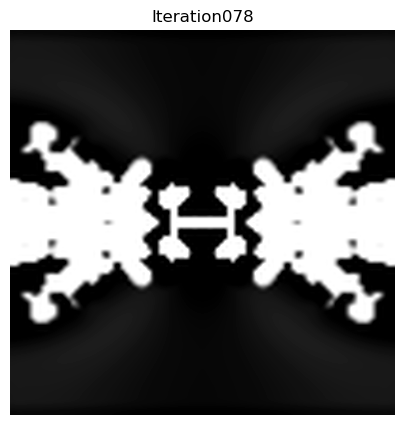

[0.5272815  0.52029462 0.5180948  ... 0.5180948  0.52029462 0.5272815 ]
2
0.5
128
[0.52692225 0.51978346 0.51728223 ... 0.51728223 0.51978346 0.52692225]


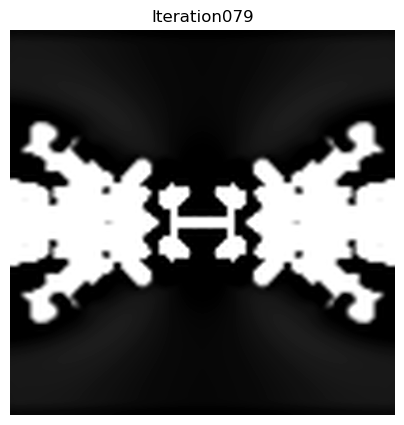

[0.52728107 0.52029404 0.51809395 ... 0.51809395 0.52029404 0.52728107]
2
0.5
128
[0.52692225 0.51978346 0.51728223 ... 0.51728223 0.51978346 0.52692225]


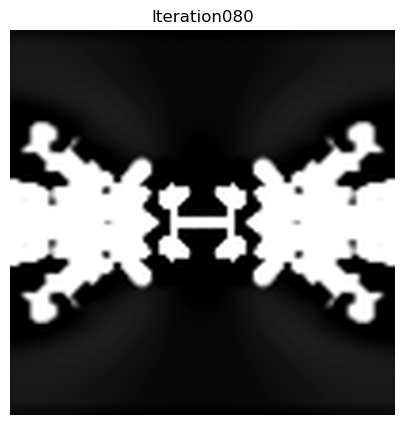

[0.52728108 0.52029406 0.51809398 ... 0.51809398 0.52029406 0.52728108]
2
0.5
128
[0.52692225 0.51978346 0.51728223 ... 0.51728223 0.51978346 0.52692225]


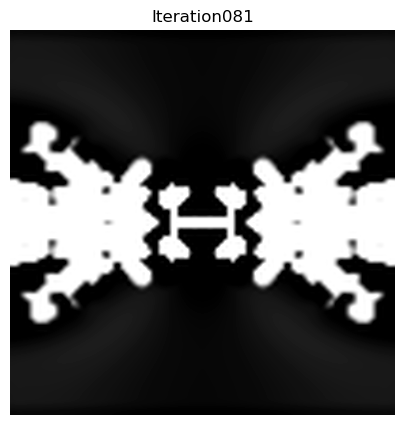

[0.52728109 0.52029408 0.518094   ... 0.518094   0.52029408 0.52728109]
2
0.5
128
[0.52692225 0.51978346 0.51728223 ... 0.51728223 0.51978346 0.52692225]


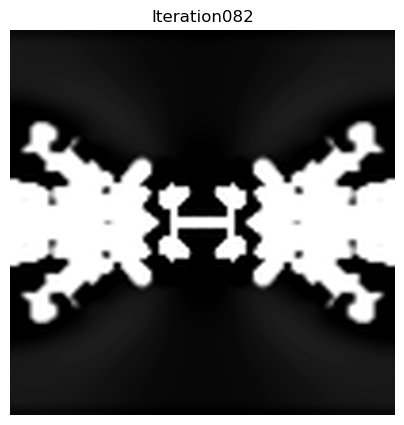

[0.5272811  0.52029409 0.51809401 ... 0.51809401 0.52029409 0.5272811 ]
2
0.5
128
[0.52692225 0.51978346 0.51728223 ... 0.51728223 0.51978346 0.52692225]


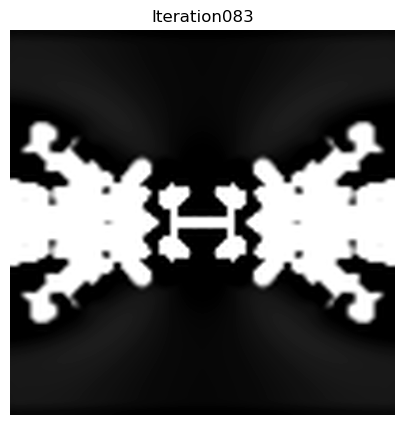

[0.52728111 0.5202941  0.51809403 ... 0.51809403 0.5202941  0.52728111]
2
0.5
128
[0.52692225 0.51978346 0.51728223 ... 0.51728223 0.51978346 0.52692225]


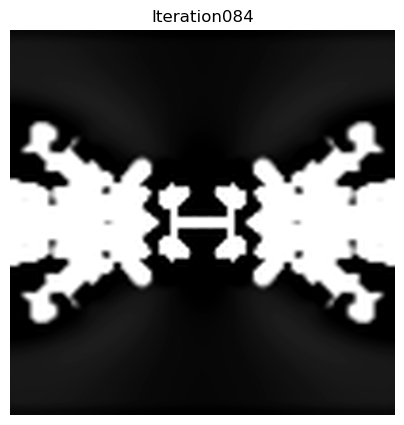

[0.52728111 0.5202941  0.51809404 ... 0.51809404 0.5202941  0.52728111]
2
0.5
128
[0.52692225 0.51978346 0.51728223 ... 0.51728223 0.51978346 0.52692225]


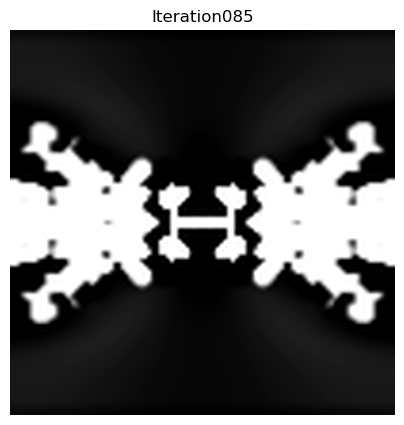

[0.52728112 0.52029411 0.51809405 ... 0.51809405 0.52029411 0.52728112]
2
0.5
128
[0.52692225 0.51978346 0.51728223 ... 0.51728223 0.51978346 0.52692225]


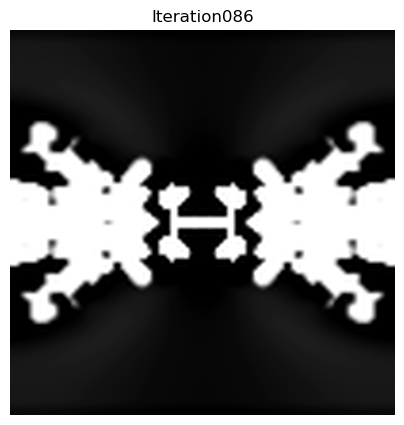

[0.52728112 0.52029411 0.51809405 ... 0.51809405 0.52029411 0.52728112]
2
0.5
128
[0.52692225 0.51978346 0.51728223 ... 0.51728223 0.51978346 0.52692225]


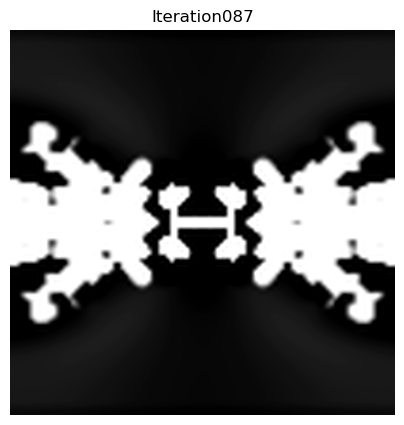

[0.52728112 0.52029412 0.51809406 ... 0.51809406 0.52029412 0.52728112]
2
0.5
128
[0.52692225 0.51978346 0.51728223 ... 0.51728223 0.51978346 0.52692225]


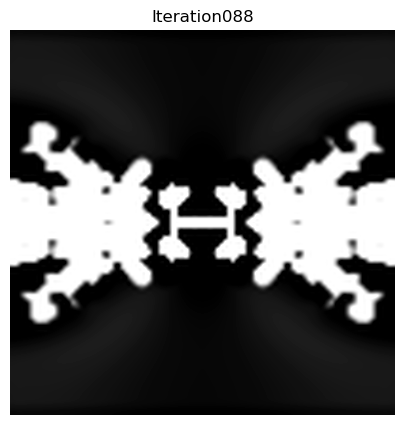

[0.52728113 0.52029412 0.51809407 ... 0.51809407 0.52029412 0.52728113]
2
0.5
128
[0.52692225 0.51978346 0.51728223 ... 0.51728223 0.51978346 0.52692225]


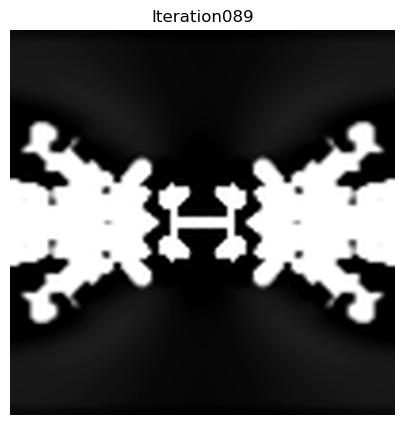

[0.52728113 0.52029412 0.51809407 ... 0.51809407 0.52029412 0.52728113]
2
0.5
256
[0.52728113 0.52029412 0.51809407 ... 0.51809407 0.52029412 0.52728113]


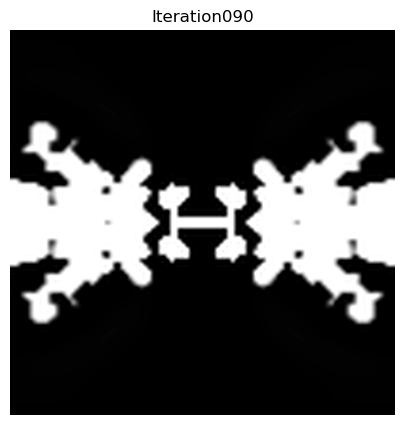

[0.5272818  0.52029597 0.51809795 ... 0.51809795 0.52029597 0.5272818 ]
2
0.5
256
[0.52728113 0.52029412 0.51809407 ... 0.51809407 0.52029412 0.52728113]


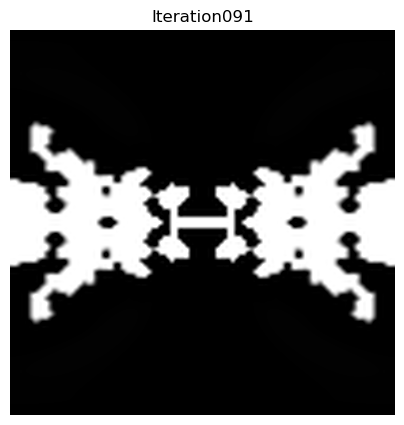

[0.52728187 0.52029617 0.51809836 ... 0.51809836 0.52029617 0.52728187]
2
0.5
256
[0.52728113 0.52029412 0.51809407 ... 0.51809407 0.52029412 0.52728113]


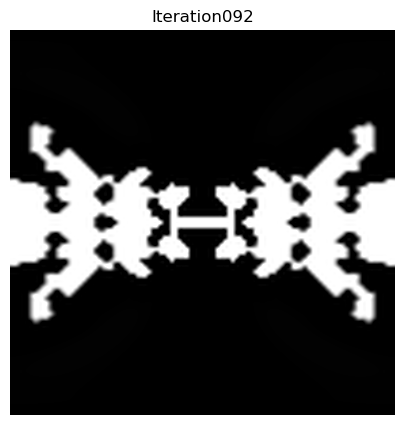

[0.52728181 0.520296   0.51809799 ... 0.51809799 0.520296   0.52728181]
2
0.5
256
[0.52728113 0.52029412 0.51809407 ... 0.51809407 0.52029412 0.52728113]


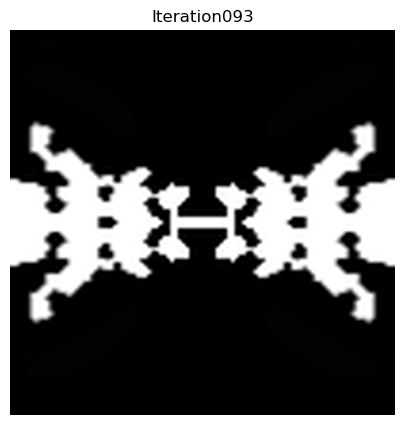

[0.5272818  0.52029598 0.51809796 ... 0.51809796 0.52029598 0.5272818 ]
2
0.5
256
[0.52728113 0.52029412 0.51809407 ... 0.51809407 0.52029412 0.52728113]


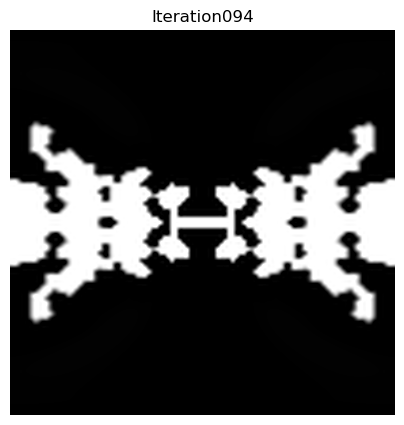

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
256
[0.52728113 0.52029412 0.51809407 ... 0.51809407 0.52029412 0.52728113]


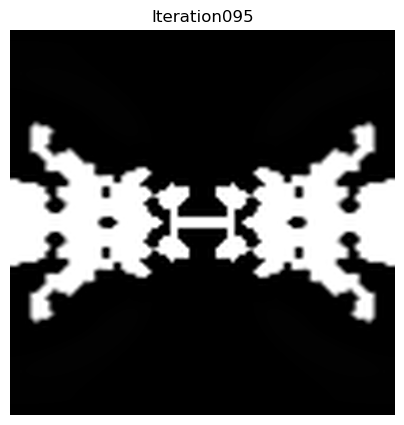

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
256
[0.52728113 0.52029412 0.51809407 ... 0.51809407 0.52029412 0.52728113]


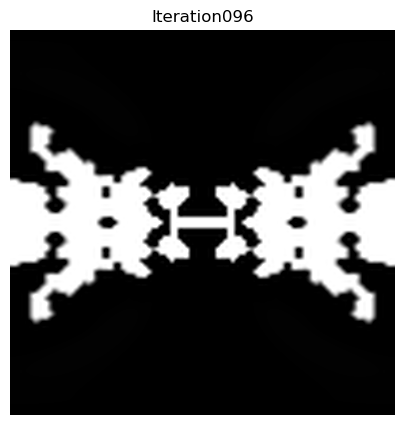

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
256
[0.52728113 0.52029412 0.51809407 ... 0.51809407 0.52029412 0.52728113]


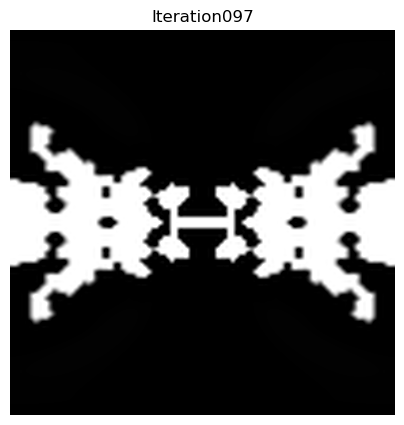

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
256
[0.52728113 0.52029412 0.51809407 ... 0.51809407 0.52029412 0.52728113]


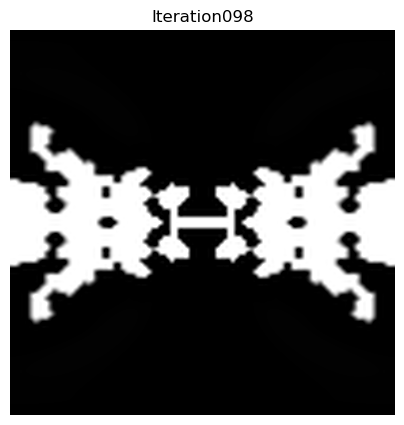

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
256
[0.52728113 0.52029412 0.51809407 ... 0.51809407 0.52029412 0.52728113]


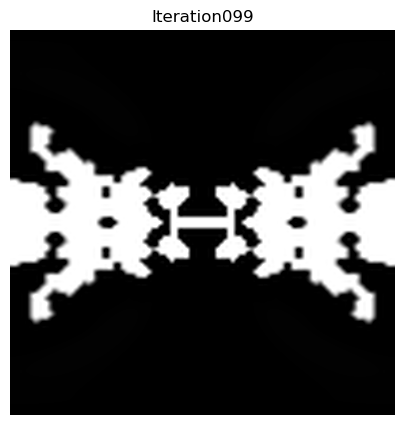

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
256
[0.52728113 0.52029412 0.51809407 ... 0.51809407 0.52029412 0.52728113]


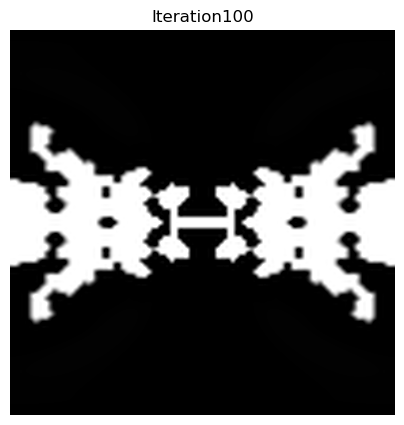

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
256
[0.52728113 0.52029412 0.51809407 ... 0.51809407 0.52029412 0.52728113]


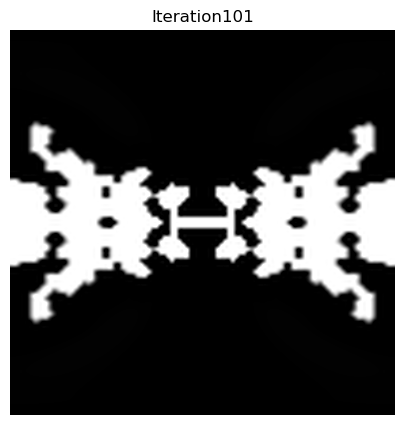

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
256
[0.52728113 0.52029412 0.51809407 ... 0.51809407 0.52029412 0.52728113]


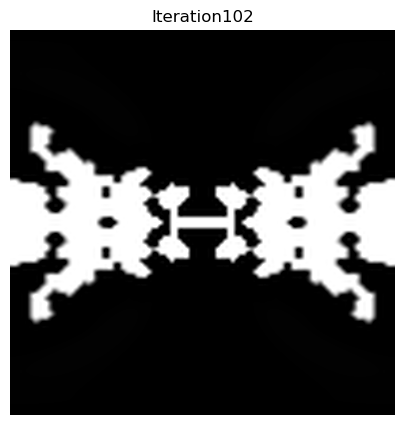

[0.5272818  0.52029598 0.51809796 ... 0.51809796 0.52029598 0.5272818 ]
2
0.5
256
[0.52728113 0.52029412 0.51809407 ... 0.51809407 0.52029412 0.52728113]


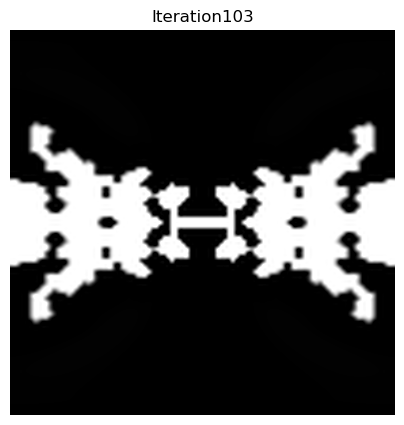

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
256
[0.52728113 0.52029412 0.51809407 ... 0.51809407 0.52029412 0.52728113]


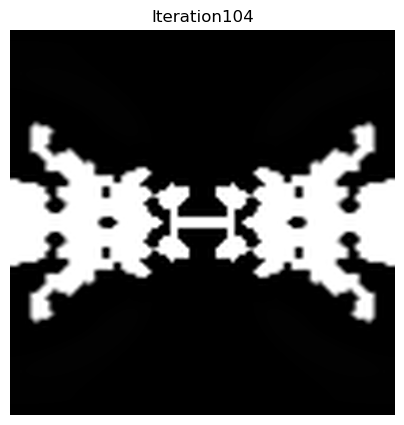

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
512
[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]


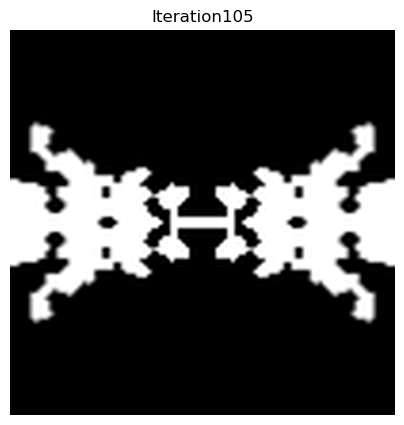

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
512
[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]


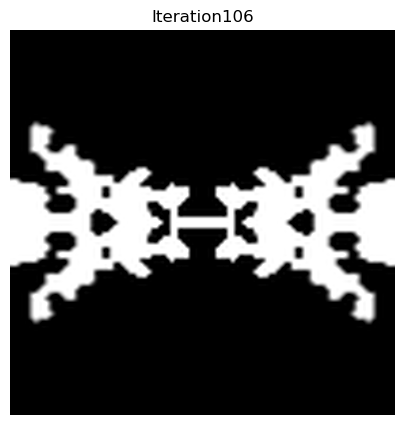

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
512
[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]


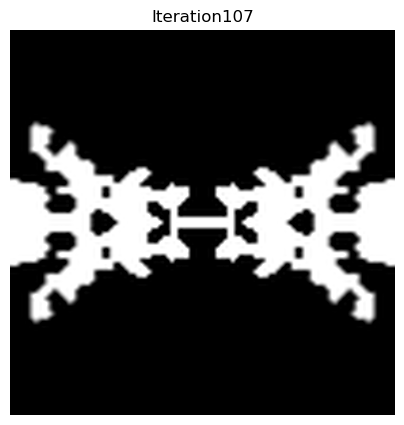

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
512
[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]


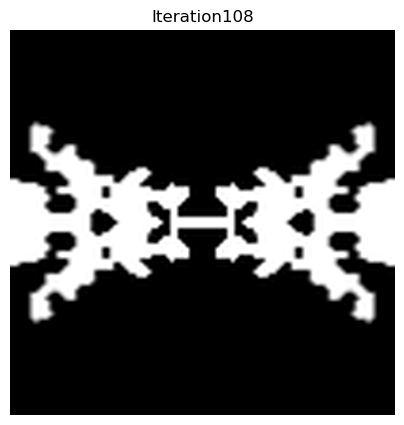

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
512
[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]


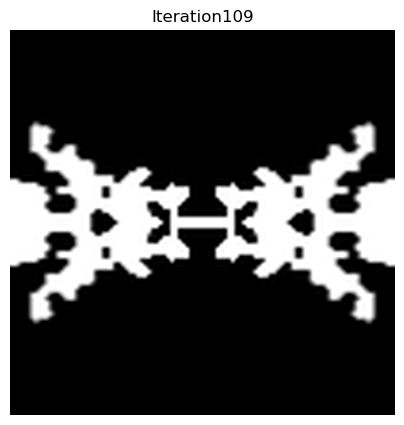

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
512
[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]


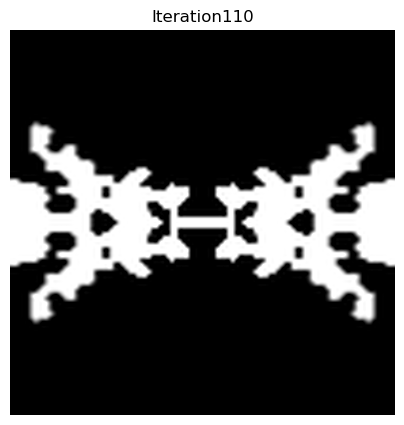

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
512
[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]


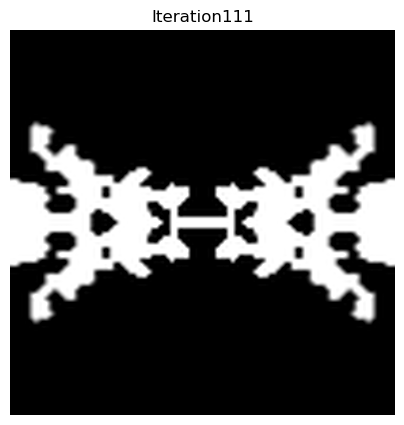

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
512
[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]


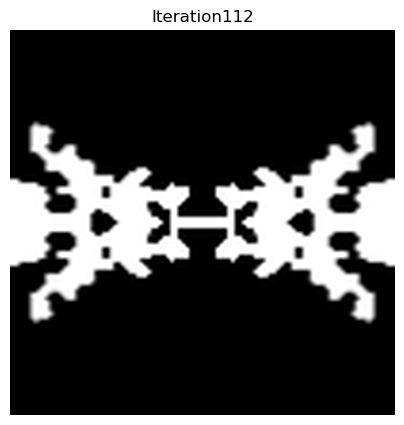

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
512
[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]


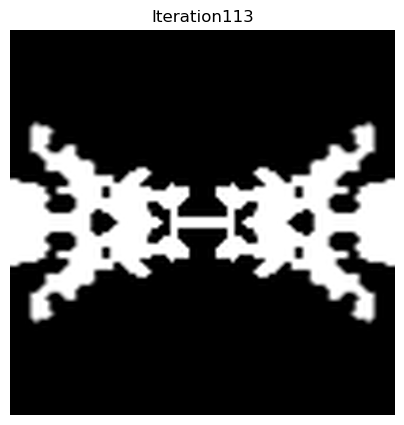

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
512
[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]


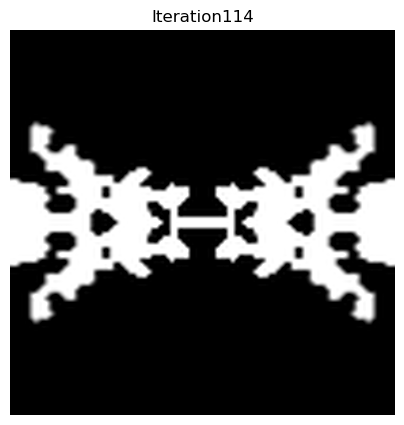

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
512
[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]


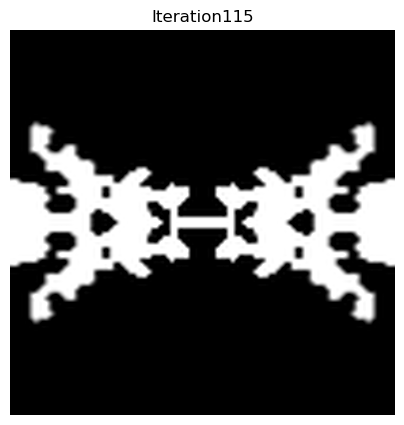

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
512
[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]


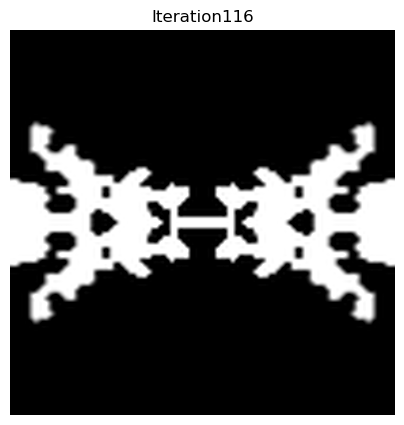

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
512
[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]


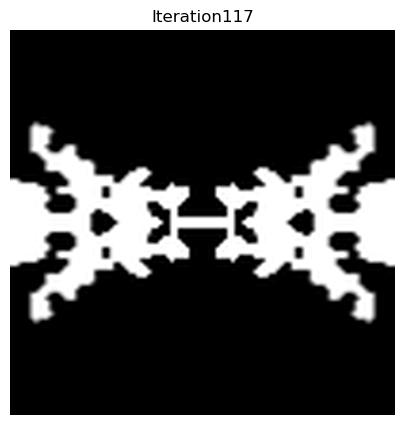

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
512
[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]


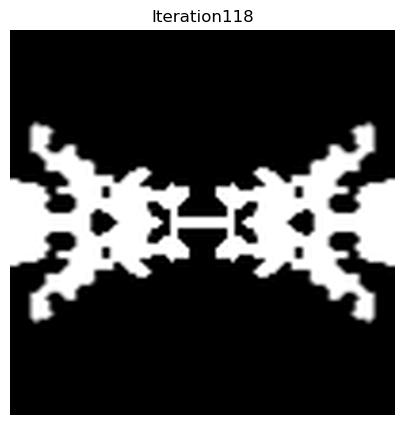

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
512
[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]


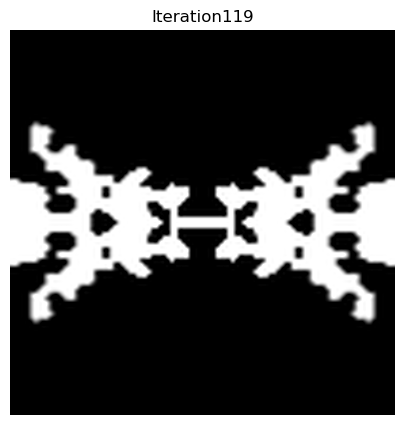

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
1024
[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]


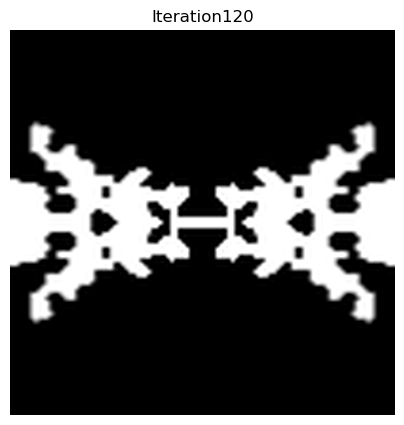

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
1024
[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]


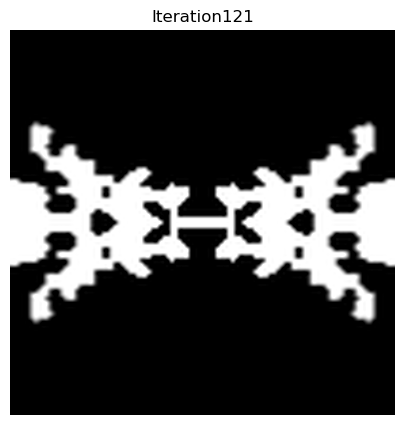

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
1024
[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]


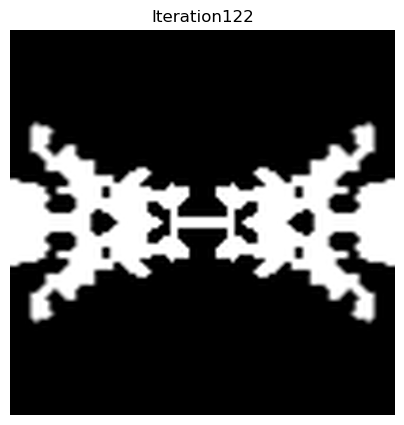

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
1024
[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]


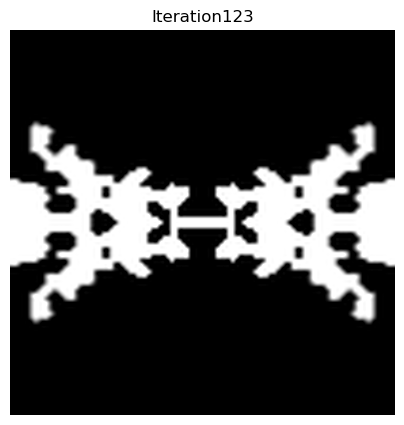

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
1024
[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]


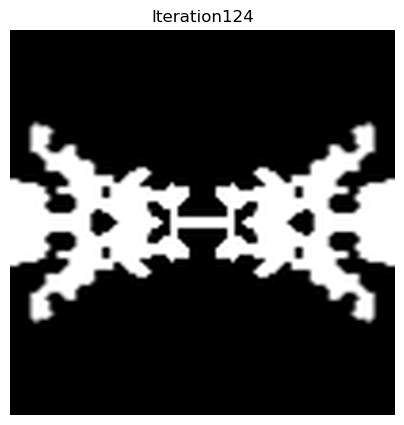

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
1024
[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]


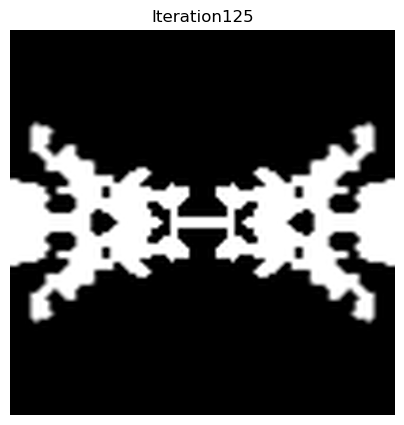

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
1024
[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]


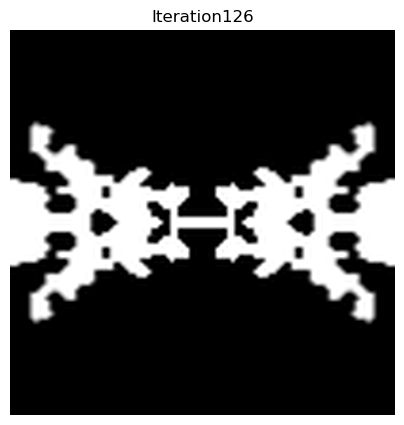

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
1024
[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]


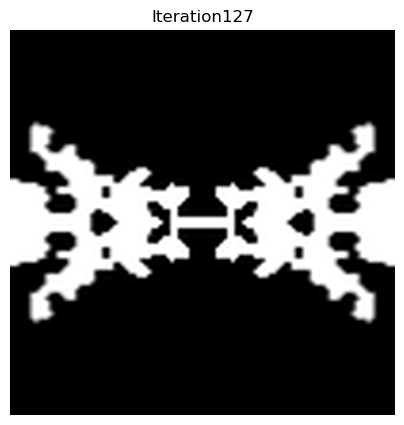

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
1024
[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]


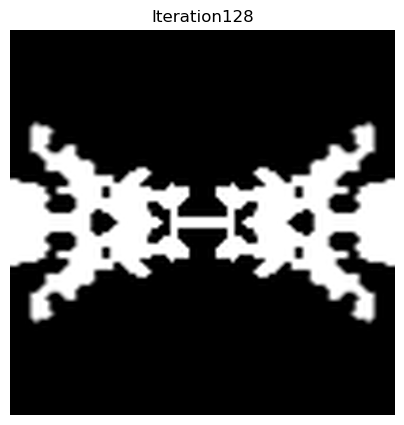

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
1024
[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]


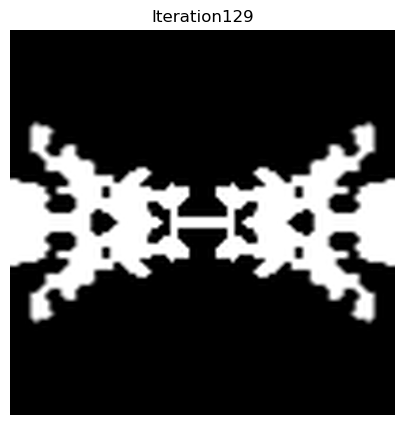

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
1024
[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]


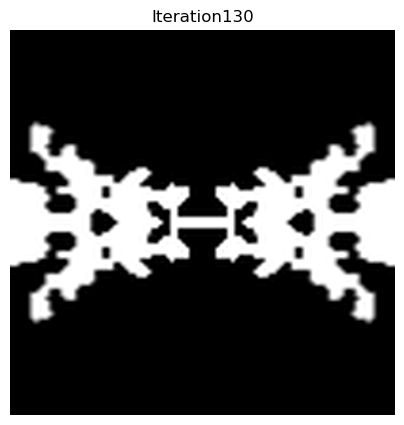

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
1024
[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]


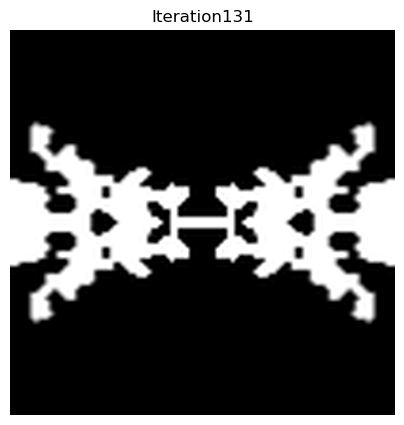

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
1024
[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]


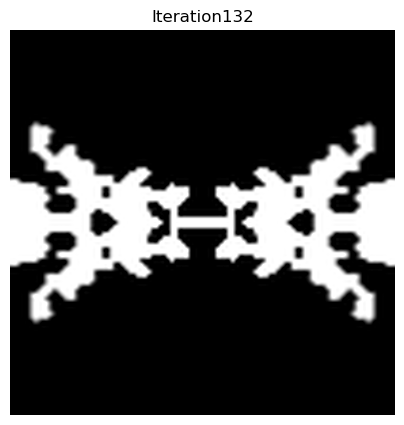

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
1024
[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]


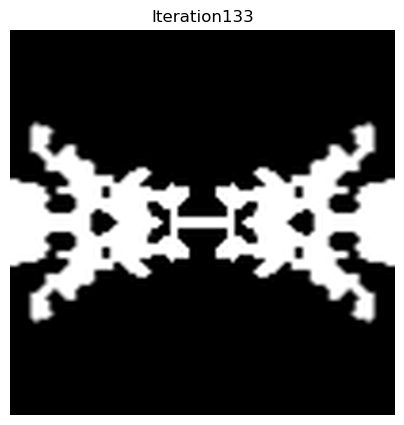

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
1024
[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]


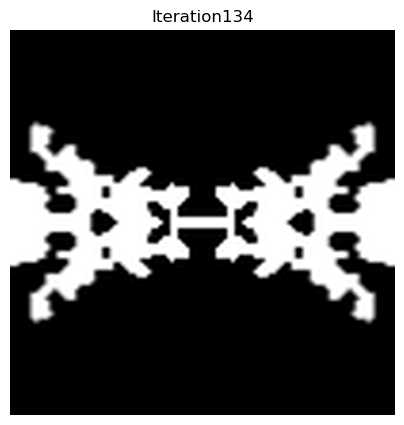

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
2048
[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]


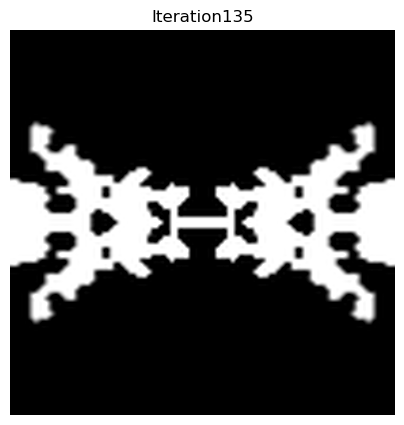

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
2048
[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]


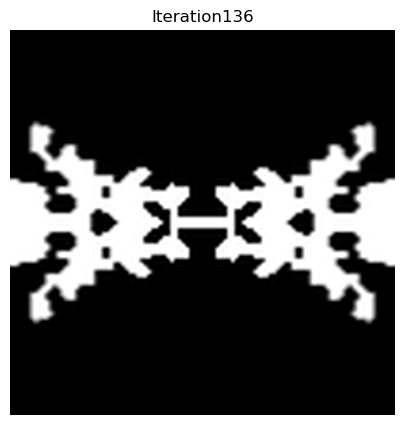

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
2048
[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]


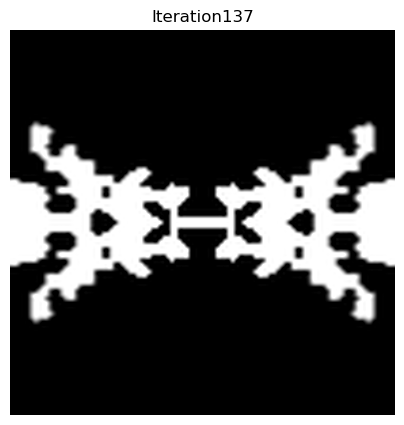

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
2048
[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]


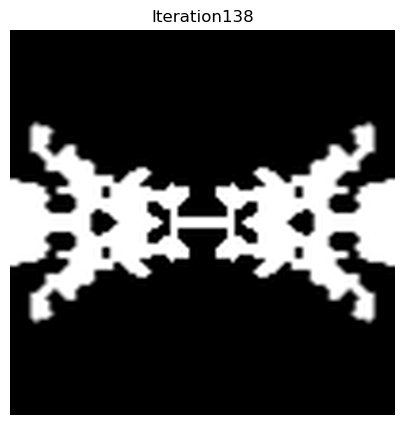

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
2048
[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]


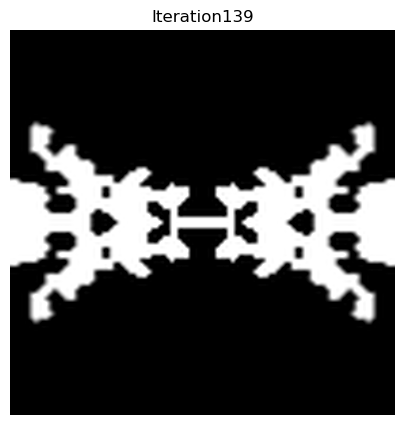

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
2048
[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]


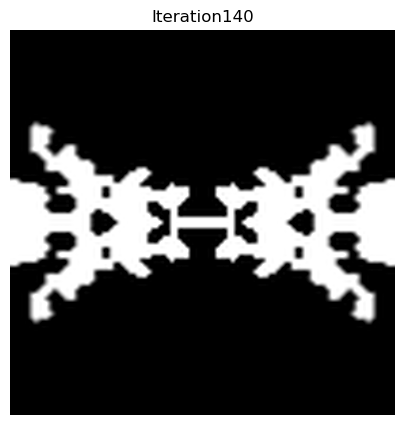

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
2048
[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]


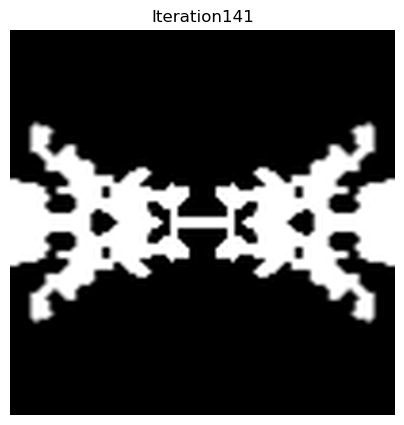

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
2048
[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]


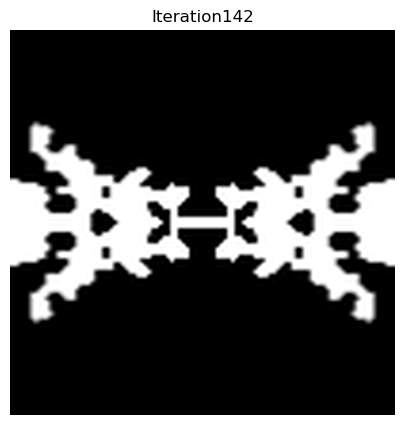

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
2048
[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]


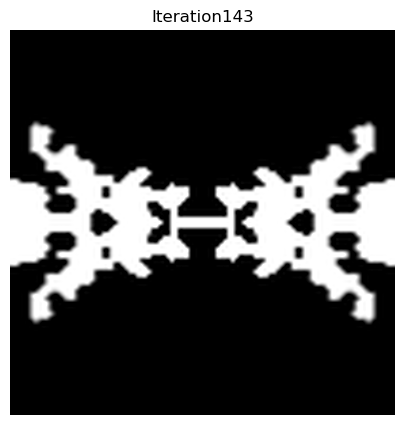

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
2048
[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]


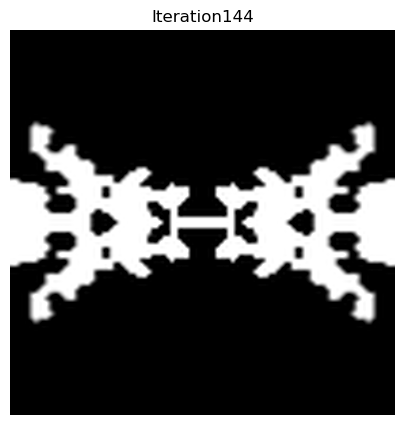

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
2048
[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]


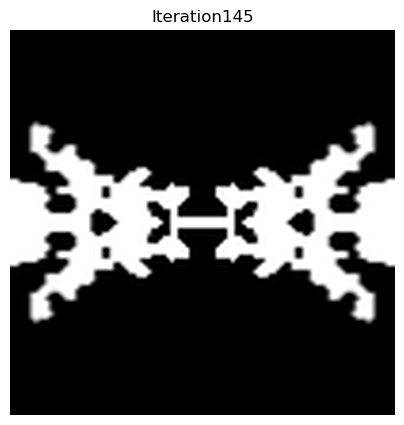

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
2048
[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]


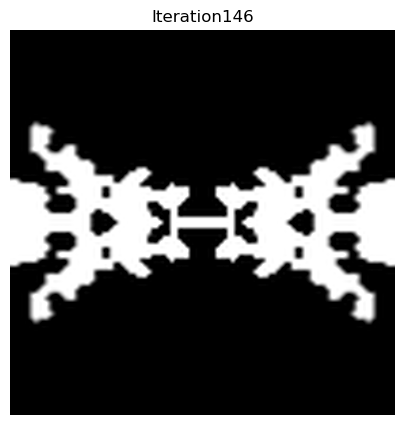

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
2048
[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]


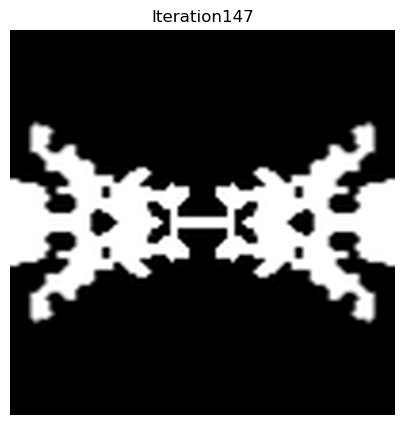

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
2048
[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]


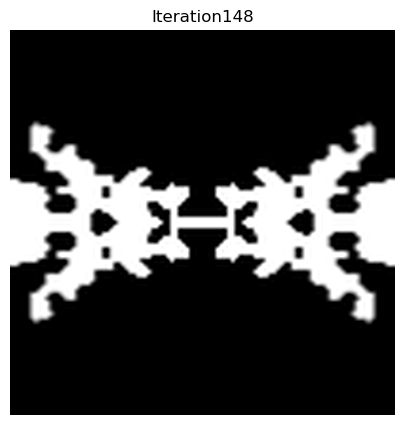

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
2048
[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]


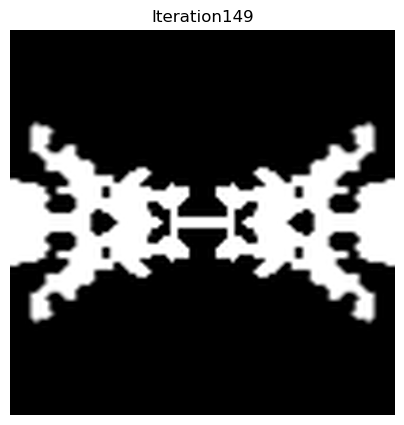

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
4096
[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]


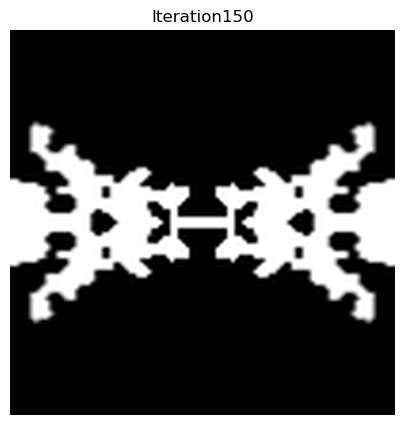

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
4096
[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]


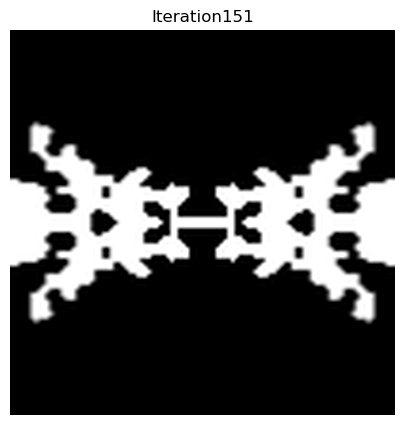

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
4096
[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]


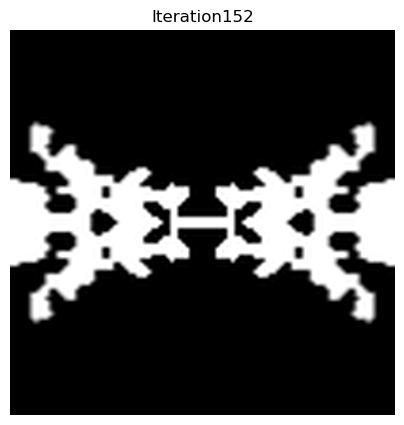

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
4096
[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]


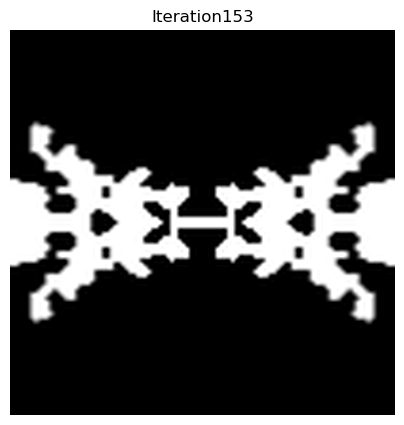

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
4096
[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]


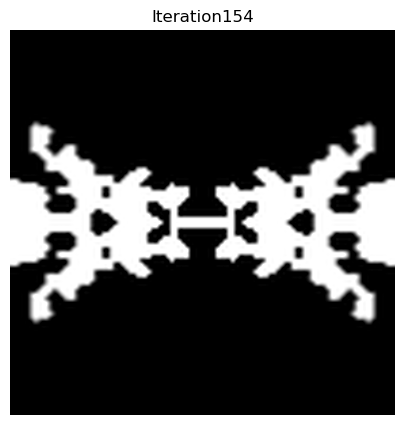

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
4096
[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]


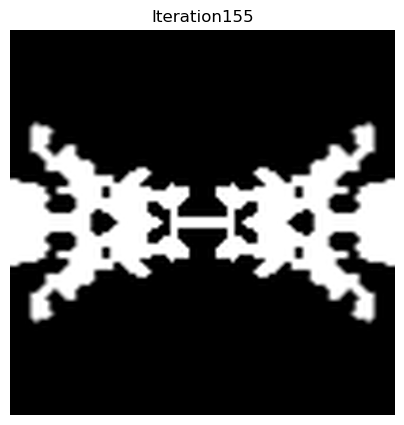

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
4096
[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]


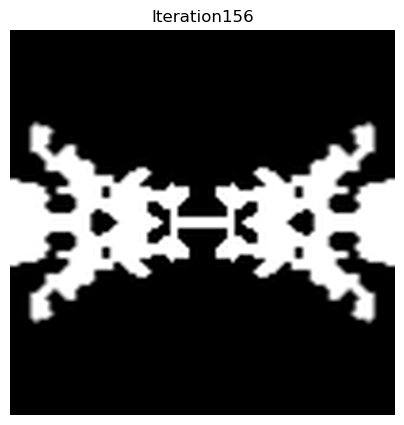

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
4096
[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]


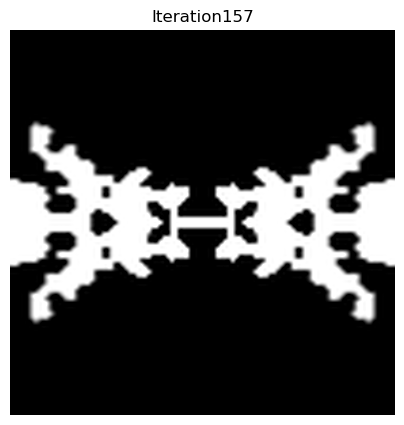

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
4096
[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]


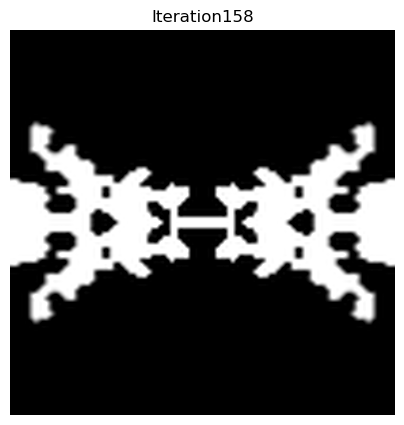

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
4096
[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]


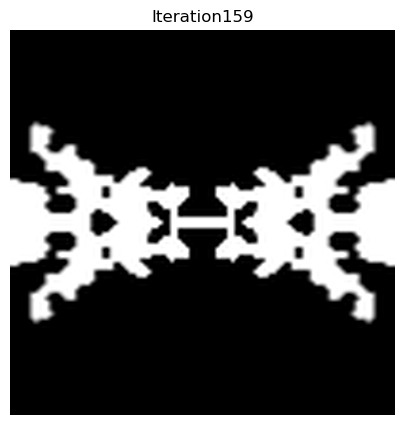

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
4096
[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]


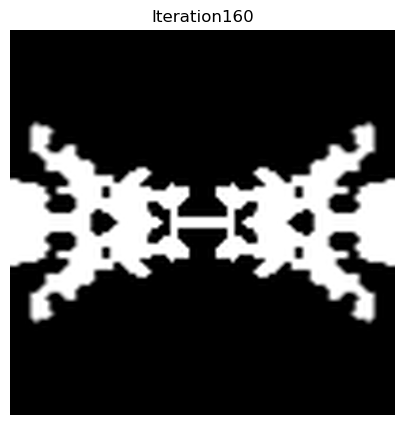

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
4096
[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]


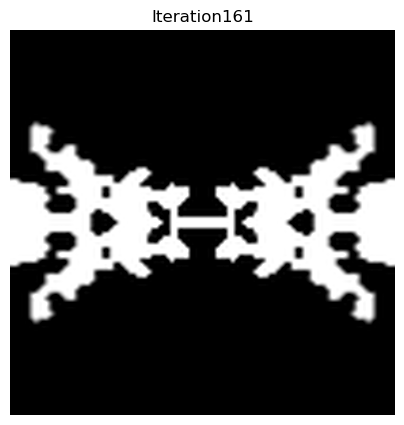

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
4096
[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]


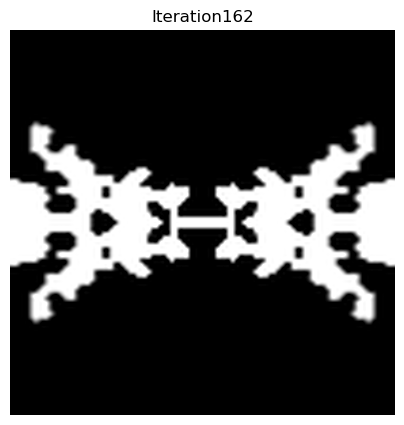

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
4096
[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]


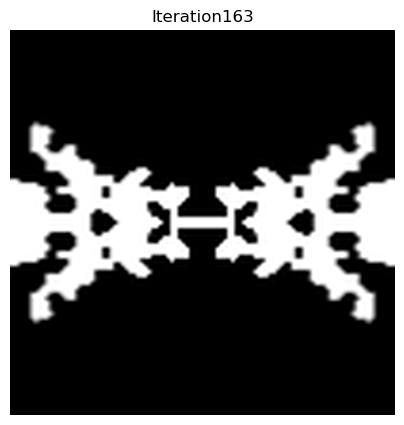

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
4096
[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]


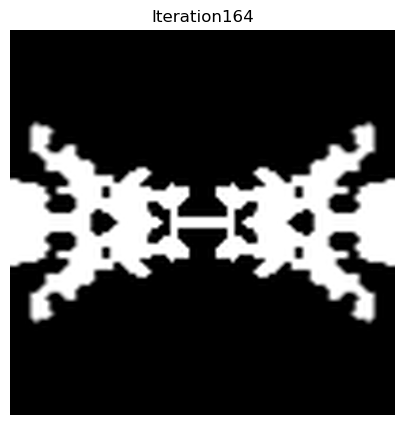

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
8192
[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]


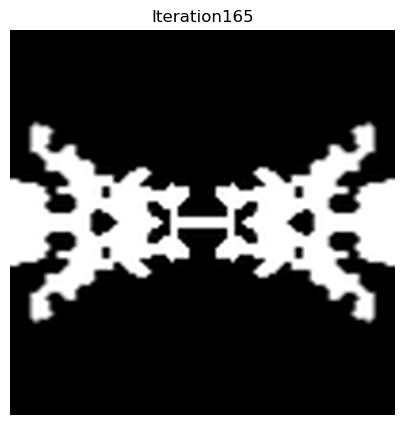

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
8192
[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]


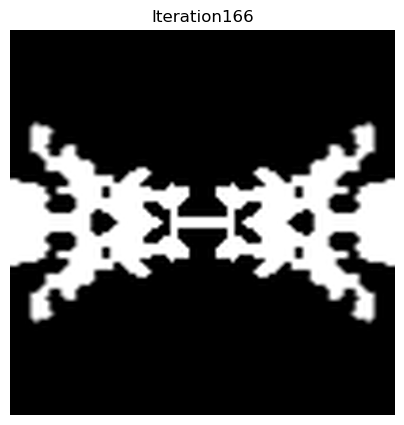

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
8192
[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]


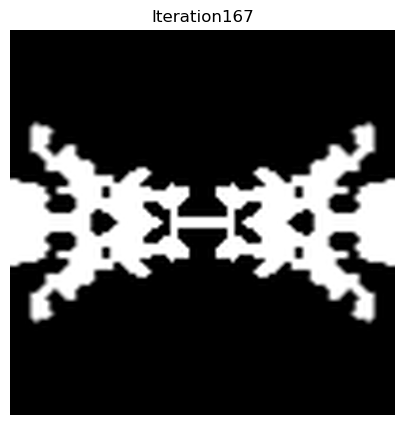

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
8192
[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]


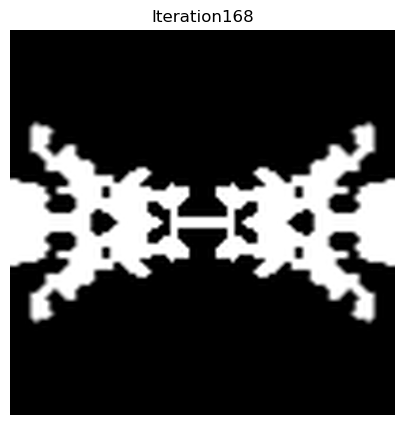

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
8192
[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]


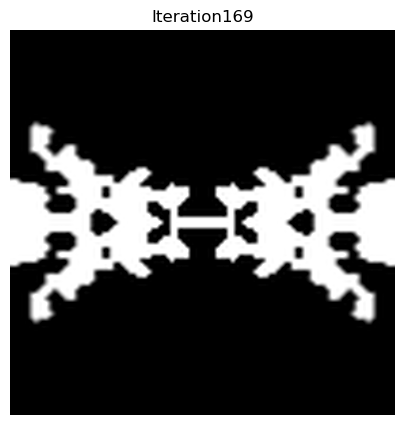

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
8192
[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]


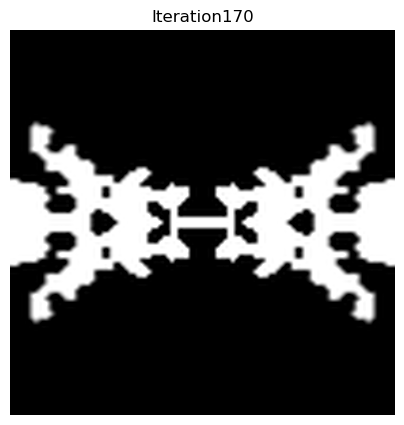

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
8192
[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]


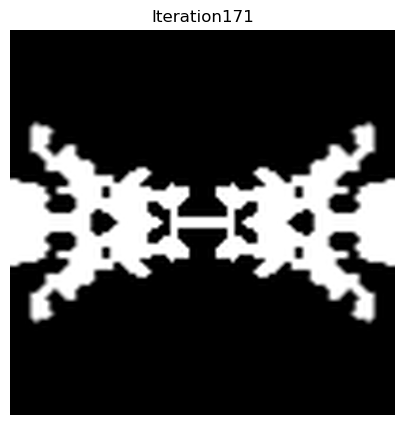

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
8192
[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]


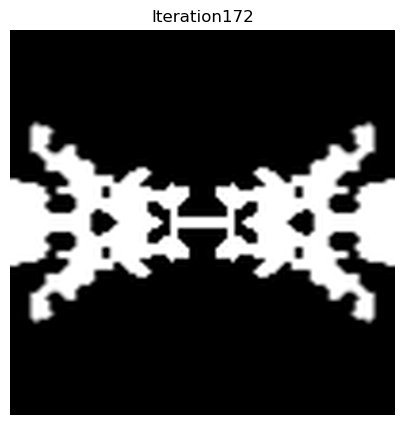

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
8192
[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]


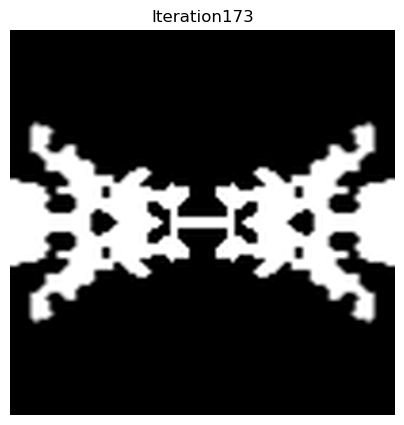

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
8192
[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]


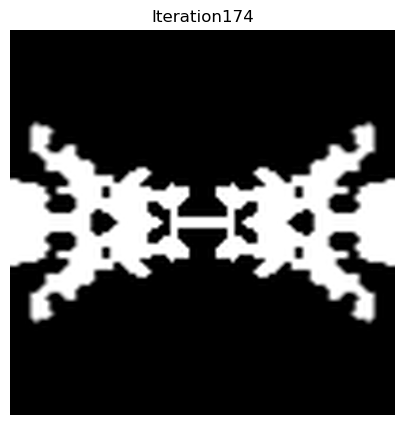

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
8192
[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]


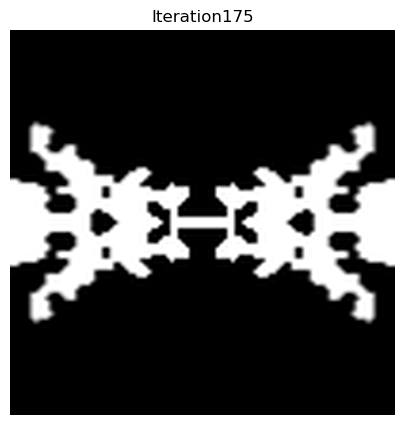

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
8192
[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]


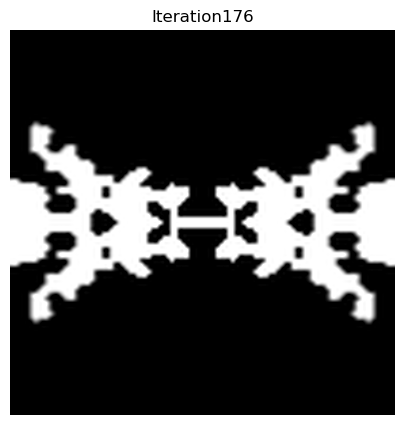

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
8192
[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]


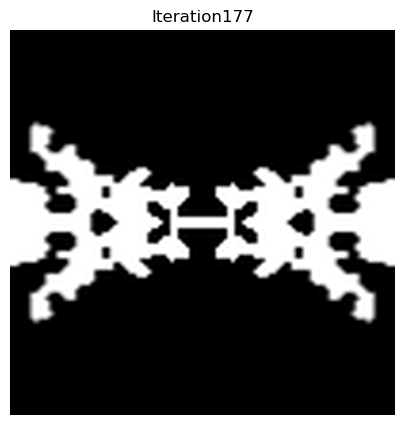

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
8192
[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]


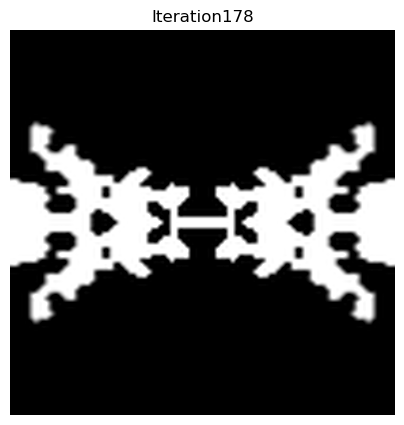

[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]
2
0.5
8192
[0.5272818  0.52029598 0.51809795 ... 0.51809795 0.52029598 0.5272818 ]


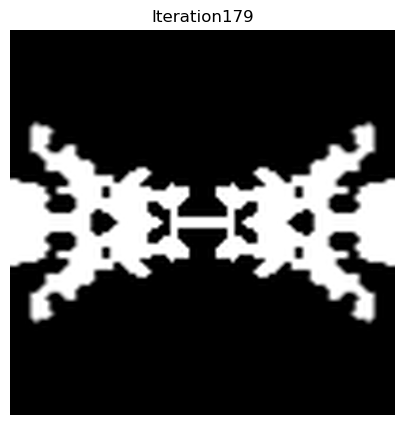

In [3]:
for i in range(1,180):
    v_array = np.load(f'Post_v_array{i:03d}.npy')
    print(v_array)
    beta_A = np.load(f'Post_beta_scale_array{i:03d}.npy')
    print(beta_A)
    eta_A = np.load(f'Post_eta_i_array{i:03d}.npy')
    print(eta_A)
    cur_A = np.load(f'Post_cur_beta_array{i:03d}.npy')
    print(cur_A)
    x_A = np.load(f'Post_x_array{i:03d}.npy')
    print(x_A)
    


    opt.update_design([mapping(v_array, eta_A, cur_A/beta_A)]) # cur_beta/beta_scale is the final beta in the optimization.
    plt.figure(figsize=(5, 5))
    plt.title(f"Iteration{i :03d}")
    ax = plt.gca()
    opt.plot2D(
        False,
        ax=ax,
        plot_sources_flag=False,
        plot_monitors_flag=False,
        plot_boundaries_flag=False,
        output_plane = mp.Volume(center=mp.Vector3(0,0,0), size=mp.Vector3(design_region_x_width, design_region_y_height, 0))
    )
    circ = Circle((2, 2), minimum_length / 2)
    ax.add_patch(circ)
    ax.axis("off")
    plt.savefig(f'PICTURE/Picture{i:03d}.png')
    plt.show()


    

In [4]:
import os
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from PIL import Image

# Set the directory where your images are stored
image_folder = "PICTURE"
image_files = sorted([os.path.join(image_folder, f) for f in os.listdir(image_folder) if f.endswith(".png")])  # Adjust for JPG, etc.

# Load images using PIL
images = [Image.open(img) for img in image_files]

# Create figure and axis
fig, ax = plt.subplots()
ax.axis("off")  # Hide axis
im = ax.imshow(images[0])  # Initialize with the first image

# Animation function
def update(frame):
    im.set_array(images[frame])
    return [im]

# Create animation
ani = animation.FuncAnimation(fig, update, frames=len(images), interval=200, blit=True)
plt.close(fig)
# Display in Jupyter Notebook
from IPython.display import HTML
HTML(ani.to_jshtml())


In [5]:
# Convert images to GIF
output_gif = "animation.gif"

# Save images as an animated GIF
images[0].save(
    output_gif,
    save_all=True,
    append_images=images[1:],
    duration=200,  # 每幀持續時間 (毫秒)
    loop=0         # 0 表示無限循環
)

print(f"GIF 已儲存至 {output_gif}")

GIF 已儲存至 animation.gif
